### TODO:
* Run with 200 starting values and 600 forecasts, stride 100
* Only predict x and y in weighted loss function

In [1]:
!pip install -q gdown reservoirpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.8/209.8 kB 4.9 MB/s eta 0:00:00


In [2]:
!ls -lh

total 220K
---------- 1 root root 218K May 27 01:53 __notebook__.ipynb


## Getting training data

In [3]:
import math
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

class Body:
    """Represents a body with methods to compute forces and displacements."""

    def __init__(self, x, y, radius, color, mass, vx=0, vy=0):
        self.x = x
        self.y = y
        self.radius = radius
        self.color = color
        self.mass = mass
        self.vx = vx
        self.vy = vy
        self.orbit = [(x, y)]

In [4]:
import numpy as np
#import matplotlib.pyplot as plt
#from scipy.integrate import solve_ivp
import pickle

# Function to load and analyze the data later
def load_test_data(filename='3body_test_data.pkl'):
    """Load test data from file"""
    with open(filename, 'rb') as f:
        test_data = pickle.load(f)
    return test_data

# Example of how to use the data for machine learning
def prepare_ml_dataset(test_data):
    """
    Convert test data into format suitable for machine learning.
    Returns X (features) and y (labels).
    """
    X = []  # Features: initial velocities
    y = []  # Labels: system state

    for result in test_data:
        # Extract initial velocities as features
        velocities = result['initial_velocities']
        features = [velocities[key] for key in ['v1x', 'v1y', 'v2x', 'v2y', 'v3x', 'v3y']]
        X.append(features)

        # Extract label
        label = result['system_state']
        y.append(label)

    return np.array(X), np.array(y)

In [5]:
import os
import pickle
from IPython import get_ipython

def load_test_data_by_size(size='large'):
  """ Downloads and loads test data based on specified size ('small' or 'large').
  Args:
    size (str): The size of the data file to load. Accepts 'small', 'large', or 'big'.
                  Defaults to 'large'.
  Returns:
      list: The loaded test data. Returns None if an invalid size is provided.
  """
  # Ensure gdown is installed
  ipython = get_ipython()
  if ipython is not None:
      ipython.run_line_magic('pip', 'install -q gdown')
  else:
      # Fallback for standard Python script execution
      try:
          import gdown
      except ImportError:
          print("Please install gdown: pip install gdown")
          return None

  filename = ''
  file_id = ''
  if size.lower() == 'small':
      filename = '3body_test_data_small.pkl'
      file_id = '1cnKznxbipsbwgH9qEaS2w22H9m5a81Xf'
      simulation_size = 301
      print(f"Attempting to download the small data file ({filename})...")
  elif size.lower() == 'large' or size.lower() == 'big':
      filename = '3body_test_data.pkl'
      file_id = '1xYzEESp3cS5MXUsEOSj-BF72S7SzkPaN'
      simulation_size = 801
      print(f"Attempting to download the large data file ({filename})...")
  else:
      print(f"Error: Invalid size '{size}'. Please use 'small', 'large', or 'big'.")
      return None

  # Construct the gdown command# Use -O to specify the output filename explicitly
  download_command = f"gdown --id {file_id} -O {filename}"

  # Download the file
  if not os.path.exists(filename):
    print(f"Executing download command: {download_command}")
    os.system(download_command)

    # Check if the file was downloaded
    if not os.path.exists(filename):
        print(f"Error: Download failed. File '{filename}' not found.")
        return None
    else:
        print(f"Download successful. File '{filename}' saved.")
  else:
      print(f"File '{filename}' exists. No download needed.")

  # Load the data
  try:
      test_data = load_test_data(filename=filename)
      print(f"Successfully loaded data from '{filename}'. Will reduce size of data to contain only simulations with length {simulation_size}")
      test_data = [data for data in test_data if len(data['positions'][list(data['positions'].keys())[0]]) == simulation_size]
      return test_data
  except Exception as e:
      print(f"Error loading data from '{filename}': {e}")
      return None

## Create training data

In [6]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from reservoirpy.nodes import ESN

In [7]:
# Create training data function
def create_training_data(test_data, seq_len=100, horizon=100, stride=10, train_split=0.8, val_split=0.1, num_values=801):

    n_full_simulations = sum(1 for data in test_data if len(data['positions'][list(data['positions'].keys())[0]]) >= num_values)
    n_sequences_per_sim = (num_values - seq_len - horizon) // stride + (1 if (num_values - seq_len - horizon) % stride != 0 else 0)
    total_sequences = n_full_simulations * n_sequences_per_sim

    """ Skip scalers since proximity between objects are important and may be lost if we scale.
    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    # Fit scalers
    for data in test_data:
        positions = data['positions']
        if len(positions[list(positions.keys())[0]]) < num_values:
            continue
        b1_pos = np.array(positions[list(positions.keys())[0]])
        b2_pos = np.array(positions[list(positions.keys())[1]])
        b3_pos = np.array(positions[list(positions.keys())[2]])
        b1_vel = np.array(data['velocities'][list(data['velocities'].keys())[0]])
        b2_vel = np.array(data['velocities'][list(data['velocities'].keys())[1]])
        b3_vel = np.array(data['velocities'][list(data['velocities'].keys())[2]])
        state = np.stack([np.concatenate([b1_pos, b1_vel], axis=-1),
                          np.concatenate([b2_pos, b2_vel], axis=-1),
                          np.concatenate([b3_pos, b3_vel], axis=-1)], axis=1)

        for i in range(0, num_values - seq_len - horizon, stride):
            X_batch = state[i:i+seq_len].reshape(1, seq_len, -1)
            y_batch = state[i+seq_len+1:i+seq_len+1+horizon].reshape(1, horizon, -1)
            scaler_X.partial_fit(X_batch.reshape(-1, seq_len * 12))
            scaler_y.partial_fit(y_batch.reshape(-1, 12))
    """
    
    X = np.empty((total_sequences, seq_len, 12), dtype=np.float32)
    y = np.empty((total_sequences, horizon, 12), dtype=np.float32)
    seq_idx = 0

    for data in test_data:
        positions = data['positions']
        if len(positions[list(positions.keys())[0]]) < num_values:
            continue
        b1_pos = np.array(positions[list(positions.keys())[0]])
        b2_pos = np.array(positions[list(positions.keys())[1]])
        b3_pos = np.array(positions[list(positions.keys())[2]])
        b1_vel = np.array(data['velocities'][list(data['velocities'].keys())[0]])
        b2_vel = np.array(data['velocities'][list(data['velocities'].keys())[1]])
        b3_vel = np.array(data['velocities'][list(data['velocities'].keys())[2]])
        state = np.stack([np.concatenate([b1_pos, b1_vel], axis=-1),
                          np.concatenate([b2_pos, b2_vel], axis=-1),
                          np.concatenate([b3_pos, b3_vel], axis=-1)], axis=1)

        for i in range(0, num_values - seq_len - horizon, stride):
            X[seq_idx] = state[i:i+seq_len].reshape(seq_len, 12)
            y[seq_idx] = state[i+seq_len+1:i+seq_len+1+horizon].reshape(horizon, 12)
            seq_idx += 1

    """
    X = scaler_X.transform(X.reshape(-1, seq_len * 12)).reshape(total_sequences, seq_len, 12)
    y = scaler_y.transform(y.reshape(-1, 12)).reshape(total_sequences, horizon, 12)
    """
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, train_size=train_split, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

    X_train = torch.tensor(X_train, dtype=torch.float)
    y_train = torch.tensor(y_train, dtype=torch.float)
    X_val = torch.tensor(X_val, dtype=torch.float)
    y_val = torch.tensor(y_val, dtype=torch.float)
    X_test = torch.tensor(X_test, dtype=torch.float)
    y_test = torch.tensor(y_test, dtype=torch.float)

    return X_train, y_train, X_val, y_val, X_test, y_test #, scaler_X, scaler_y

In [8]:
# Create a def that loads dataset, large or small, and creates training data.

def load_and_create_training_data(size='large', seq_len=100, horizon=100, stride=10, train_split=0.8, val_split=0.1, num_values=801):
  test_data = load_test_data_by_size(size)
  print(f"Number of entries in test_data: {len(test_data)}")
  X_train, y_train, X_val, y_val, X_test, y_test = create_training_data(test_data, seq_len=seq_len, horizon=horizon, stride=stride, train_split=train_split, val_split=val_split, num_values=num_values)
  return X_train, y_train, X_val, y_val, X_test, y_test

In [9]:
# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [10]:
horizon = 600
seq_len = 200
stride = 400
# Load data
X_train, y_train, X_val, y_val, X_test, y_test = load_and_create_training_data('big', seq_len=seq_len, horizon=horizon, stride=stride, train_split=0.8, val_split=0.1, num_values=801)
print(X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape)

Note: you may need to restart the kernel to use updated packages.
Attempting to download the large data file (3body_test_data.pkl)...
Executing download command: gdown --id 1xYzEESp3cS5MXUsEOSj-BF72S7SzkPaN -O 3body_test_data.pkl


/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1xYzEESp3cS5MXUsEOSj-BF72S7SzkPaN
From (redirected): https://drive.google.com/uc?id=1xYzEESp3cS5MXUsEOSj-BF72S7SzkPaN&confirm=t&uuid=601a3748-7a91-4a33-b48c-0e877940eea2
To: /kaggle/working/3body_test_data.pkl
100%|██████████| 1.07G/1.07G [00:06<00:00, 158MB/s]


Download successful. File '3body_test_data.pkl' saved.
Successfully loaded data from '3body_test_data.pkl'. Will reduce size of data to contain only simulations with length 801
Number of entries in test_data: 2352
torch.Size([1881, 200, 12]) torch.Size([1881, 600, 12]) torch.Size([235, 200, 12]) torch.Size([235, 600, 12]) torch.Size([236, 200, 12]) torch.Size([236, 600, 12])


In [11]:
!ls -lh 3body_test_data*

-rw-r--r-- 1 root root 1021M May 13 21:33 3body_test_data.pkl


In [12]:
!rm 3body_test_data.pkl

## Setting up Neural Network models

### LSTM model

In [13]:
# Define LSTM model: one forecast point
class LSTM(nn.Module):
    def __init__(self, input_dim=12, hidden_dim=128, output_dim=12):
        super(LSTM, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=2, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        _, (h_n, _) = self.lstm(x)
        return self.fc(h_n[-1])

# Initialize model and move to device
model_lstm = LSTM().to(device)
optimizer = torch.optim.Adam(model_lstm.parameters(), lr=0.001)
criterion = nn.MSELoss()

In [14]:
# Define LSTM model: forecast horizon
class LSTMForecast(nn.Module):
    def __init__(self, input_dim=12, hidden_dim=128, output_dim=12, forecast_horizon=25):
        super(LSTMForecast, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=2, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.forecast_horizon = forecast_horizon

    def forward(self, x):
        batch_size = x.size(0)
        outputs = []
        h, c = None, None

        # Use the input sequence to initialize the hidden state
        out, (h, c) = self.lstm(x)

        # Use the last timestep's output as the seed for forecasting
        input_step = x[:, -1:, :]  # (batch, 1, input_dim)

        for _ in range(self.forecast_horizon):
            out, (h, c) = self.lstm(input_step, (h, c))  # Feed one step at a time
            pred = self.fc(out)  # (batch, 1, output_dim)
            outputs.append(pred)
            input_step = pred  # Feed prediction as next input

        return torch.cat(outputs, dim=1)  # (batch, forecast_horizon, output_dim)


### RC-ESN model (Reservoir)

In [15]:
import torch
import torch.nn as nn

class ReservoirForecast(nn.Module):
    def __init__(self, input_size, reservoir_size, output_size, forecast_horizon,
                 alpha=0.5, ridge_lambda=1e-2, input_scaling=0.1, density=0.1, spectral_radius=0.8):
        super().__init__()
        self.input_size = input_size
        self.reservoir_size = reservoir_size
        self.output_size = output_size
        self.horizon = forecast_horizon
        self.alpha = alpha
        self.ridge_lambda = ridge_lambda
    
        # Sparse random reservoir
        def sparse_random_matrix(size, density):
            mask = (torch.rand(size, size) < density).float()
            return torch.randn(size, size) * mask
    
        def scale_spectral_radius(W, target_radius):
            eigvals = torch.linalg.eigvals(W)
            radius = eigvals.abs().max()
            return W * (target_radius / radius)
    
        W_res_init = sparse_random_matrix(reservoir_size, density)
        W_res_scaled = scale_spectral_radius(W_res_init, spectral_radius)
    
        self.register_buffer('W_in', torch.randn(reservoir_size, input_size) * input_scaling)
        self.register_buffer('W_res', W_res_scaled)
    
        self.readout = None

    def weighted_loss(self, output, target):
        """
        Calculates a weighted mean squared error loss.
        Loss is higher for errors closer to the start of the forecast horizon.

        Args:
            output (torch.Tensor): Predicted tensor (batch, horizon, output_size).
            target (torch.Tensor): Target tensor (batch, horizon, output_size).

        Returns:
            torch.Tensor: Weighted mean squared error loss.
        """
        # Ensure output and target have the expected shape
        if output.shape != target.shape or output.ndim != 3:
            raise ValueError(f"Output and target shapes must match and be 3D (batch, horizon, output_size). Got output shape {output.shape}, target shape {target.shape}")

        horizon = output.shape[1]
        # Create weights that decrease linearly from 1.0 to 0.4 across the horizon
        # unsqueeze(0) adds a batch dimension (1)
        # unsqueeze(-1) adds a feature dimension (1)
        weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)

        # Calculate squared error
        squared_error = (output - target) ** 2

        # Apply weights and calculate the mean loss
        weighted_squared_error = squared_error * weights

        return weighted_squared_error.mean()

    def forward_reservoir(self, x):
        # Ensure buffers are on the same device as x
        self.W_in = self.W_in.to(x.device)
        self.W_res = self.W_res.to(x.device)

        batch_size, seq_len, _ = x.size()
        h = torch.zeros(batch_size, self.reservoir_size, device=x.device)

        for t in range(seq_len):
            u = x[:, t, :]
            h = (1 - self.alpha) * h + self.alpha * torch.tanh(
                F.linear(u, self.W_in) + F.linear(h, self.W_res)
            )

        return h  # shape: (batch_size, reservoir_size)

    
    def fit(self, X_train, y_train):
        with torch.no_grad():
            states = self.forward_reservoir(X_train)
            # states = (states - states.mean(0)) / (states.std(0) + 1e-6)
        y_flat = y_train.reshape(y_train.shape[0], -1)
    
        X = states
        X_T = X.T
        ridge = self.ridge_lambda * torch.eye(self.reservoir_size, device=X.device, dtype=X.dtype)
        self.W_out = torch.linalg.solve(X_T @ X + ridge, X_T @ y_flat)
        self.readout = nn.Linear(self.reservoir_size, y_flat.shape[1], bias=False)
        self.readout.weight.data = self.W_out.T
    
        # --- Calculate and print weighted loss after fitting ---
        # Make prediction on the training data using the newly fitted readout
        y_pred_flat = X @ self.W_out # (batch_size, horizon * output_size)

        # Reshape predictions back to (batch_size, horizon, output_size) for weighted loss calculation
        y_pred = y_pred_flat.view(X_train.shape[0], self.horizon, self.output_size)

        # Calculate the weighted loss
        loss = self.weighted_loss(y_pred, y_train) # Pass the reshaped predictions and original y_train
        print(f"Training Weighted Loss: {loss.item():.6f}") # Use .item() to get scalar value

    def forward(self, X):
        """
        x: (batch, time, input_size)
        Returns: (batch, horizon, output_size)
        """
        with torch.no_grad():
            states = self.forward_reservoir(X)  # (batch, reservoir_size)
        output = self.readout(states)
        return output.view(X.shape[0], self.horizon, self.output_size)



### Modern TCN model

In [16]:
#__all__ = ['Transpose', 'get_activation_fn', 'moving_avg', 'series_decomp', 'PositionalEncoding', 'SinCosPosEncoding', 'Coord2dPosEncoding', 'Coord1dPosEncoding', 'positional_encoding']
#__all__ = ['moving_avg', 'series_decomp',  'Flatten_Head']
import torch
from torch import nn
import math
# decomposition

class moving_avg(nn.Module):
    """
    Moving average block to highlight the trend of time series
    """
    def __init__(self, kernel_size, stride):
        super(moving_avg, self).__init__()
        self.kernel_size = kernel_size
        self.avg = nn.AvgPool1d(kernel_size=kernel_size, stride=stride, padding=0)

    def forward(self, x):
        # padding on the both ends of time series
        front = x[:, 0:1, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        end = x[:, -1:, :].repeat(1, (self.kernel_size - 1) // 2, 1)
        x = torch.cat([front, x, end], dim=1)
        x = self.avg(x.permute(0, 2, 1))
        x = x.permute(0, 2, 1)
        return x


class series_decomp(nn.Module):
    """
    Series decomposition block
    """
    def __init__(self, kernel_size):
        super(series_decomp, self).__init__()
        self.moving_avg = moving_avg(kernel_size, stride=1)

    def forward(self, x):
        moving_mean = self.moving_avg(x)
        res = x - moving_mean
        return res, moving_mean


# forecast task head
class Flatten_Head(nn.Module):
    def __init__(self, individual, n_vars, nf, target_window, head_dropout=0):
        super(Flatten_Head, self).__init__()

        self.individual = individual
        self.n_vars = n_vars

        if self.individual:
            self.linears = nn.ModuleList()
            self.dropouts = nn.ModuleList()
            self.flattens = nn.ModuleList()
            for i in range(self.n_vars):
                self.flattens.append(nn.Flatten(start_dim=-2))
                self.linears.append(nn.Linear(nf, target_window))
                self.dropouts.append(nn.Dropout(head_dropout))
        else:
            self.flatten = nn.Flatten(start_dim=-2)
            self.linear = nn.Linear(nf, target_window)
            self.dropout = nn.Dropout(head_dropout)

    def forward(self, x):  # x: [bs x nvars x d_model x patch_num]
        if self.individual:
            x_out = []
            for i in range(self.n_vars):
                z = self.flattens[i](x[:, i, :, :])  # z: [bs x d_model * patch_num]
                z = self.linears[i](z)  # z: [bs x target_window]
                z = self.dropouts[i](z)
                x_out.append(z)
            x = torch.stack(x_out, dim=1)  # x: [bs x nvars x target_window]
        else:
            x = self.flatten(x)
            x = self.linear(x)
            x = self.dropout(x)
        return x

In [17]:
import torch
import torch.nn as nn

class RevIN(nn.Module):
    def __init__(self, num_features: int, eps=1e-5, affine=True, subtract_last=False):
        """
        :param num_features: the number of features or channels
        :param eps: a value added for numerical stability
        :param affine: if True, RevIN has learnable affine parameters
        """
        super(RevIN, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.affine = affine
        self.subtract_last = subtract_last
        if self.affine:
            self._init_params()

    def forward(self, x, mode:str):
        if mode == 'norm':
            self._get_statistics(x)
            x = self._normalize(x)
        elif mode == 'denorm':
            x = self._denormalize(x)
        else: raise NotImplementedError
        return x

    def _init_params(self):
        # initialize RevIN params: (C,)
        self.affine_weight = nn.Parameter(torch.ones(self.num_features))
        self.affine_bias = nn.Parameter(torch.zeros(self.num_features))

    def _get_statistics(self, x):
        dim2reduce = tuple(range(1, x.ndim-1))
        if self.subtract_last:
            self.last = x[:,-1,:].unsqueeze(1)
        else:
            self.mean = torch.mean(x, dim=dim2reduce, keepdim=True).detach()
        self.stdev = torch.sqrt(torch.var(x, dim=dim2reduce, keepdim=True, unbiased=False) + self.eps).detach()

    def _normalize(self, x):
        if self.subtract_last:
            x = x - self.last
        else:
            x = x - self.mean
        x = x / self.stdev
        if self.affine:
            x = x * self.affine_weight
            x = x + self.affine_bias
        return x

    def _denormalize(self, x):
        if self.affine:
            x = x - self.affine_bias
            x = x / (self.affine_weight + self.eps*self.eps)
        x = x * self.stdev
        if self.subtract_last:
            x = x + self.last
        else:
            x = x + self.mean
        return x

In [18]:
import torch
from torch import nn
import torch.nn.functional as F
import math
#from layers.RevIN import RevIN
#from models.ModernTCN_Layer import series_decomp, Flatten_Head


class LayerNorm(nn.Module):
    def __init__(self, channels, eps=1e-6, data_format="channels_last"):
        super(LayerNorm, self).__init__()
        self.norm = nn.Layernorm(channels)

    def forward(self, x):
        B, M, D, N = x.shape
        x = x.permute(0, 1, 3, 2)
        x = x.reshape(B * M, N, D)
        x = self.norm(x)
        x = x.reshape(B, M, N, D)
        x = x.permute(0, 1, 3, 2)
        return x

def get_conv1d(in_channels, out_channels, kernel_size, stride, padding, dilation, groups, bias):
    return nn.Conv1d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride,
                     padding=padding, dilation=dilation, groups=groups, bias=bias)


def get_bn(channels):
    return nn.BatchNorm1d(channels)

def conv_bn(in_channels, out_channels, kernel_size, stride, padding, groups, dilation=1,bias=False):
    if padding is None:
        padding = kernel_size // 2
    result = nn.Sequential()
    result.add_module('conv', get_conv1d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size,
                                         stride=stride, padding=padding, dilation=dilation, groups=groups, bias=bias))
    result.add_module('bn', get_bn(out_channels))
    return result

def fuse_bn(conv, bn):

    kernel = conv.weight
    running_mean = bn.running_mean
    running_var = bn.running_var
    gamma = bn.weight
    beta = bn.bias
    eps = bn.eps
    std = (running_var + eps).sqrt()
    t = (gamma / std).reshape(-1, 1, 1)
    return kernel * t, beta - running_mean * gamma / std

class ReparamLargeKernelConv(nn.Module):

    def __init__(self, in_channels, out_channels, kernel_size,
                 stride, groups,
                 small_kernel,
                 small_kernel_merged=False, nvars=7):
        super(ReparamLargeKernelConv, self).__init__()
        self.kernel_size = kernel_size
        self.small_kernel = small_kernel
        # We assume the conv does not change the feature map size, so padding = k//2. Otherwise, you may configure padding as you wish, and change the padding of small_conv accordingly.
        padding = kernel_size // 2
        if small_kernel_merged:
            self.lkb_reparam = nn.Conv1d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size,
                                         stride=stride, padding=padding, dilation=1, groups=groups, bias=True)
        else:
            self.lkb_origin = conv_bn(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size,
                                        stride=stride, padding=padding, dilation=1, groups=groups,bias=False)
            if small_kernel is not None:
                assert small_kernel <= kernel_size, 'The kernel size for re-param cannot be larger than the large kernel!'
                self.small_conv = conv_bn(in_channels=in_channels, out_channels=out_channels,
                                            kernel_size=small_kernel,
                                            stride=stride, padding=small_kernel // 2, groups=groups, dilation=1,bias=False)


    def forward(self, inputs):

        if hasattr(self, 'lkb_reparam'):
            out = self.lkb_reparam(inputs)
        else:
            out = self.lkb_origin(inputs)
            if hasattr(self, 'small_conv'):
                out += self.small_conv(inputs)

        return out

    def PaddingTwoEdge1d(self,x,pad_length_left,pad_length_right,pad_values=0):

        D_out,D_in,ks=x.shape
        if pad_values ==0:
            pad_left = torch.zeros(D_out,D_in,pad_length_left)
            pad_right = torch.zeros(D_out,D_in,pad_length_right)
        else:
            pad_left = torch.ones(D_out, D_in, pad_length_left) * pad_values
            pad_right = torch.ones(D_out, D_in, pad_length_right) * pad_values
        x = torch.cat([pad_left,x],dims=-1)
        x = torch.cat([x,pad_right],dims=-1)
        return x

    def get_equivalent_kernel_bias(self):

        eq_k, eq_b = fuse_bn(self.lkb_origin.conv, self.lkb_origin.bn)

        if hasattr(self, 'small_conv'):
            small_k, small_b = fuse_bn(self.small_conv.conv, self.small_conv.bn)

            eq_b += small_b

            eq_k += self.PaddingTwoEdge1d(small_k, (self.kernel_size - self.small_kernel) // 2,
                                          (self.kernel_size - self.small_kernel) // 2, 0)
        return eq_k, eq_b

    def merge_kernel(self):
        eq_k, eq_b = self.get_equivalent_kernel_bias()
        self.lkb_reparam = nn.Conv1d(in_channels=self.lkb_origin.conv.in_channels,
                                     out_channels=self.lkb_origin.conv.out_channels,
                                     kernel_size=self.lkb_origin.conv.kernel_size, stride=self.lkb_origin.conv.stride,
                                     padding=self.lkb_origin.conv.padding, dilation=self.lkb_origin.conv.dilation,
                                     groups=self.lkb_origin.conv.groups, bias=True)
        self.lkb_reparam.weight.data = eq_k
        self.lkb_reparam.bias.data = eq_b
        self.__delattr__('lkb_origin')
        if hasattr(self, 'small_conv'):
            self.__delattr__('small_conv')

class Block(nn.Module):
    def __init__(self, large_size, small_size, dmodel, dff, nvars, small_kernel_merged=False, drop=0.1):

        super(Block, self).__init__()
        self.dw = ReparamLargeKernelConv(in_channels=nvars * dmodel, out_channels=nvars * dmodel,
                                         kernel_size=large_size, stride=1, groups=nvars * dmodel,
                                         small_kernel=small_size, small_kernel_merged=small_kernel_merged, nvars=nvars)
        self.norm = nn.BatchNorm1d(dmodel)

        #convffn1
        self.ffn1pw1 = nn.Conv1d(in_channels=nvars * dmodel, out_channels=nvars * dff, kernel_size=1, stride=1,
                                 padding=0, dilation=1, groups=nvars)
        self.ffn1act = nn.GELU()
        self.ffn1pw2 = nn.Conv1d(in_channels=nvars * dff, out_channels=nvars * dmodel, kernel_size=1, stride=1,
                                 padding=0, dilation=1, groups=nvars)
        self.ffn1drop1 = nn.Dropout(drop)
        self.ffn1drop2 = nn.Dropout(drop)

        #convffn2
        self.ffn2pw1 = nn.Conv1d(in_channels=nvars * dmodel, out_channels=nvars * dff, kernel_size=1, stride=1,
                                 padding=0, dilation=1, groups=dmodel)
        self.ffn2act = nn.GELU()
        self.ffn2pw2 = nn.Conv1d(in_channels=nvars * dff, out_channels=nvars * dmodel, kernel_size=1, stride=1,
                                 padding=0, dilation=1, groups=dmodel)
        self.ffn2drop1 = nn.Dropout(drop)
        self.ffn2drop2 = nn.Dropout(drop)

        self.ffn_ratio = dff//dmodel
    def forward(self,x):

        input = x
        B, M, D, N = x.shape
        x = x.reshape(B,M*D,N)
        x = self.dw(x)
        x = x.reshape(B,M,D,N)
        x = x.reshape(B*M,D,N)
        x = self.norm(x)
        x = x.reshape(B, M, D, N)
        x = x.reshape(B, M * D, N)

        x = self.ffn1drop1(self.ffn1pw1(x))
        x = self.ffn1act(x)
        x = self.ffn1drop2(self.ffn1pw2(x))
        x = x.reshape(B, M, D, N)

        x = x.permute(0, 2, 1, 3)
        x = x.reshape(B, D * M, N)
        x = self.ffn2drop1(self.ffn2pw1(x))
        x = self.ffn2act(x)
        x = self.ffn2drop2(self.ffn2pw2(x))
        x = x.reshape(B, D, M, N)
        x = x.permute(0, 2, 1, 3)

        x = input + x
        return x


class Stage(nn.Module):
    def __init__(self, ffn_ratio, num_blocks, large_size, small_size, dmodel, dw_model, nvars,
                 small_kernel_merged=False, drop=0.1):

        super(Stage, self).__init__()
        d_ffn = dmodel * ffn_ratio
        blks = []
        for i in range(num_blocks):
            blk = Block(large_size=large_size, small_size=small_size, dmodel=dmodel, dff=d_ffn, nvars=nvars, small_kernel_merged=small_kernel_merged, drop=drop)
            blks.append(blk)

        self.blocks = nn.ModuleList(blks)

    def forward(self, x):

        for blk in self.blocks:
            x = blk(x)

        return x


class ModernTCN(nn.Module):
    def __init__(self,patch_size,patch_stride, stem_ratio, downsample_ratio, ffn_ratio, num_blocks, large_size, small_size, dims, dw_dims,
                 nvars, small_kernel_merged=False, backbone_dropout=0.1, head_dropout=0.1, use_multi_scale=True, revin=True, affine=True,
                 subtract_last=False, freq=None, seq_len=512, c_in=7, individual=False, target_window=96):

        super(ModernTCN, self).__init__()



        # RevIN
        self.revin = revin
        if self.revin:
            self.revin_layer = RevIN(c_in, affine=affine, subtract_last=subtract_last)

        # stem layer & down sampling layers(if needed)
        self.downsample_layers = nn.ModuleList()
        stem = nn.Sequential(

            nn.Conv1d(1, dims[0], kernel_size=patch_size, stride=patch_stride),
            nn.BatchNorm1d(dims[0])
        )
        self.downsample_layers.append(stem)
        for i in range(3):
            downsample_layer = nn.Sequential(
                nn.BatchNorm1d(dims[i]),
                nn.Conv1d(dims[i], dims[i + 1], kernel_size=downsample_ratio, stride=downsample_ratio),
            )
            self.downsample_layers.append(downsample_layer)
        self.patch_size = patch_size
        self.patch_stride = patch_stride
        self.downsample_ratio = downsample_ratio

        if freq == 'h':
            time_feature_num = 4
        elif freq == 't':
            time_feature_num = 5
        else:
            raise NotImplementedError("time_feature_num should be 4 or 5")

        self.te_patch = nn.Sequential(

            nn.Conv1d(time_feature_num, time_feature_num, kernel_size=patch_size, stride=patch_stride,groups=time_feature_num),
            nn.Conv1d(time_feature_num, dims[0], kernel_size=1, stride=1, groups=1),
            nn.BatchNorm1d(dims[0]))

        # backbone

        self.num_stage = len(num_blocks)
        self.stages = nn.ModuleList()
        for stage_idx in range(self.num_stage):
            layer = Stage(ffn_ratio, num_blocks[stage_idx], large_size[stage_idx], small_size[stage_idx], dmodel=dims[stage_idx],
                          dw_model=dw_dims[stage_idx], nvars=nvars, small_kernel_merged=small_kernel_merged, drop=backbone_dropout)
            self.stages.append(layer)

        # Multi scale fusing (if needed)
        self.use_multi_scale = use_multi_scale
        self.up_sample_ratio = downsample_ratio

        self.lat_layer = nn.ModuleList()
        self.smooth_layer = nn.ModuleList()
        self.up_sample_conv = nn.ModuleList()
        for i in range(self.num_stage):
            align_dim = dims[-1]
            lat = nn.Conv1d(dims[i], align_dim, kernel_size=1,
                            stride=1)
            self.lat_layer.append(lat)
            smooth = nn.Conv1d(align_dim, align_dim, kernel_size=3, stride=1, padding=1)
            self.smooth_layer.append(smooth)

            up_conv = nn.Sequential(
                nn.ConvTranspose1d(align_dim, align_dim, kernel_size=self.up_sample_ratio, stride=self.up_sample_ratio),
                nn.BatchNorm1d(align_dim))
            self.up_sample_conv.append(up_conv)

        # head
        patch_num = seq_len // patch_stride

        self.n_vars = c_in
        self.individual = individual
        d_model = dims[-1]
        if use_multi_scale:
            self.head_nf = d_model * patch_num
            self.head = Flatten_Head(self.individual, self.n_vars, self.head_nf, target_window,
                                     head_dropout=head_dropout)
        else:

            if patch_num % pow(downsample_ratio,(self.num_stage - 1)) == 0:
                self.head_nf = d_model * patch_num // pow(downsample_ratio,(self.num_stage - 1))
            else:
                self.head_nf = d_model * (patch_num // pow(downsample_ratio, (self.num_stage - 1))+1)
            self.head = Flatten_Head(self.individual, self.n_vars, self.head_nf, target_window,
                                     head_dropout=head_dropout)

    def up_sample(self, x, upsample_ratio):
        _, _, _, N = x.shape
        return F.upsample(x, size=N, scale_factor=upsample_ratio, mode='bilinear')

    def forward_feature(self, x, te=None):

        B,M,L=x.shape

        x = x.unsqueeze(-2)
        for i in range(self.num_stage):
            B, M, D, N = x.shape
            x = x.reshape(B * M, D, N)
            if i==0:
                if self.patch_size != self.patch_stride:
                    # stem layer padding
                    pad_len = self.patch_size - self.patch_stride
                    pad = x[:,:,-1:].repeat(1,1,pad_len)
                    x = torch.cat([x,pad],dim=-1)
            else:
                if N % self.downsample_ratio != 0:
                    pad_len = self.downsample_ratio - (N % self.downsample_ratio)
                    x = torch.cat([x, x[:, :, -pad_len:]],dim=-1)
            x = self.downsample_layers[i](x)
            _, D_, N_ = x.shape
            x = x.reshape(B, M, D_, N_)
            x = self.stages[i](x)
        return x

    def forward(self, x, te=None):

        # instance norm
        if self.revin:
            x = x.permute(0, 2, 1)
            x = self.revin_layer(x, 'norm')
            x = x.permute(0, 2, 1)
        x = self.forward_feature(x,te)
        x = self.head(x)
        # de-instance norm
        if self.revin:
            x = x.permute(0, 2, 1)
            x = self.revin_layer(x, 'denorm')
            x = x.permute(0, 2, 1)
        return x

    def structural_reparam(self):
        for m in self.modules():
            if hasattr(m, 'merge_kernel'):
                m.merge_kernel()


class Model(nn.Module):
    def __init__(self, configs):
        super(Model, self).__init__()
        # hyper param

        self.stem_ratio = configs.stem_ratio
        self.downsample_ratio = configs.downsample_ratio
        self.ffn_ratio = configs.ffn_ratio
        self.num_blocks = configs.num_blocks
        self.large_size = configs.large_size
        self.small_size = configs.small_size
        self.dims = configs.dims
        self.dw_dims = configs.dw_dims

        self.nvars = configs.enc_in
        self.small_kernel_merged = configs.small_kernel_merged
        self.drop_backbone = configs.dropout
        self.drop_head = configs.head_dropout
        self.use_multi_scale = configs.use_multi_scale
        self.revin = configs.revin
        self.affine = configs.affine
        self.subtract_last = configs.subtract_last

        self.freq = configs.freq
        self.seq_len = configs.seq_len
        self.c_in = self.nvars,
        self.individual = configs.individual
        self.target_window = configs.pred_len

        self.kernel_size = configs.kernel_size
        self.patch_size = configs.patch_size
        self.patch_stride = configs.patch_stride


        # decomp
        self.decomposition = configs.decomposition
        if self.decomposition:
            self.decomp_module = series_decomp(self.kernel_size)
            self.model_res = ModernTCN(patch_size=self.patch_size,patch_stride=self.patch_stride,stem_ratio=self.stem_ratio, downsample_ratio=self.downsample_ratio, ffn_ratio=self.ffn_ratio, num_blocks=self.num_blocks, large_size=self.large_size, small_size=self.small_size, dims=self.dims, dw_dims=self.dw_dims,
                 nvars=self.nvars, small_kernel_merged=self.small_kernel_merged, backbone_dropout=self.drop_backbone, head_dropout=self.drop_head, use_multi_scale=self.use_multi_scale, revin=self.revin, affine=self.affine,
                 subtract_last=self.subtract_last, freq=self.freq, seq_len=self.seq_len, c_in=self.c_in, individual=self.individual, target_window=self.target_window)
            self.model_trend = ModernTCN(patch_size=self.patch_size,patch_stride=self.patch_stride,stem_ratio=self.stem_ratio, downsample_ratio=self.downsample_ratio, ffn_ratio=self.ffn_ratio, num_blocks=self.num_blocks, large_size=self.large_size, small_size=self.small_size, dims=self.dims, dw_dims=self.dw_dims,
                 nvars=self.nvars, small_kernel_merged=self.small_kernel_merged, backbone_dropout=self.drop_backbone, head_dropout=self.drop_head, use_multi_scale=self.use_multi_scale, revin=self.revin, affine=self.affine,
                 subtract_last=self.subtract_last, freq=self.freq, seq_len=self.seq_len, c_in=self.c_in, individual=self.individual, target_window=self.target_window)
        else:
            self.model = ModernTCN(patch_size=self.patch_size,patch_stride=self.patch_stride,stem_ratio=self.stem_ratio, downsample_ratio=self.downsample_ratio, ffn_ratio=self.ffn_ratio, num_blocks=self.num_blocks, large_size=self.large_size, small_size=self.small_size, dims=self.dims, dw_dims=self.dw_dims,
                 nvars=self.nvars, small_kernel_merged=self.small_kernel_merged, backbone_dropout=self.drop_backbone, head_dropout=self.drop_head, use_multi_scale=self.use_multi_scale, revin=self.revin, affine=self.affine,
                 subtract_last=self.subtract_last, freq=self.freq, seq_len=self.seq_len, c_in=self.c_in, individual=self.individual, target_window=self.target_window)

    def forward(self, x, te=None):

        if self.decomposition:
            res_init, trend_init = self.decomp_module(x)
            res_init, trend_init = res_init.permute(0, 2, 1), trend_init.permute(0, 2, 1)
            if te is not None:
                te = te.permute(0, 2, 1)
            res = self.model_res(res_init, te)
            trend = self.model_trend(trend_init, te)
            x = res + trend
            x = x.permute(0, 2, 1)
        else:
            x = x.permute(0, 2, 1)
            if te is not None:
                te = te.permute(0, 2, 1)
            x = self.model(x, te)
            x = x.permute(0, 2, 1)
        return x

#### Modern version simplified

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler # Corrected import
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import time # For timing epochs

# Helper for Causal Padding (conceptual, for demonstration)
def causal_padding_manual(x, kernel_size, dilation_rate):
    pad_len = (kernel_size - 1) * dilation_rate
    return torch.nn.functional.pad(x, (pad_len, 0))

class ModernTCNStem(nn.Module):
    def __init__(self, num_variables, input_sequence_length, embed_dim, patch_size, stride):
        super().__init__()
        self.num_variables = num_variables
        self.embed_dim = embed_dim
        self.patch_size = patch_size
        self.stride = stride

        self.stem_conv = nn.Conv1d(
            in_channels=1,
            out_channels=embed_dim,
            kernel_size=patch_size,
            stride=stride
        )

        self.output_seq_len = int((input_sequence_length - patch_size) / stride + 1)
        if self.output_seq_len < 1:
            raise ValueError(f"Stem output sequence length is too short. Input L={input_sequence_length}, P={patch_size}, S={stride}. Ensure patch_size <= input_sequence_length.")


    def forward(self, x):
        # x: (batch_size, num_variables, sequence_length) - This is the input shape AFTER permute in ModernTCN's forward
        batch_size, num_variables, seq_len = x.shape
        
        # --- FIX START ---
        # Before reshaping with .view(), ensure the tensor is contiguous.
        # This is because x might have been permuted, breaking contiguity for the 'view' operation.
        x_contiguous = x.contiguous() 
        # --- FIX END ---

        # Reshape to (batch_size * num_variables, 1, sequence_length)
        # to apply stem_conv independently to each variable's time series
        x_reshaped = x_contiguous.view(batch_size * num_variables, 1, seq_len)
        
        # Apply the convolution stem
        x_embedded = self.stem_conv(x_reshaped)
        # x_embedded: (batch_size * num_variables, embed_dim, num_patches)

        # Reshape back to (batch_size, num_variables, embed_dim, num_patches)
        x_embedded = x_embedded.view(batch_size, num_variables, self.embed_dim, -1)
        return x_embedded


class ModernTCNBlock(nn.Module):
    def __init__(self, num_variables, embed_dim, kernel_size, dilation_rate, dropout_rate, expansion_ratio):
        super().__init__()
        self.num_variables = num_variables
        self.embed_dim = embed_dim
        self.expansion_dim = int(embed_dim * expansion_ratio)

        # 1. DWConv (Temporal Mixing - variable and feature independent)
        self.dwconv = nn.Conv1d(
            in_channels=num_variables * embed_dim,
            out_channels=num_variables * embed_dim,
            kernel_size=kernel_size,
            dilation=dilation_rate,
            padding='same',
            groups=num_variables * embed_dim
        )
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(dropout_rate)

        # 2. ConvFFN1 (Feature Mixing - per variable)
        self.convffn1_proj_in = nn.Conv1d(
            in_channels=num_variables * embed_dim,
            out_channels=num_variables * self.expansion_dim,
            kernel_size=1,
            groups=num_variables
        )
        self.convffn1_relu = nn.ReLU()
        self.convffn1_proj_out = nn.Conv1d(
            in_channels=num_variables * self.expansion_dim,
            out_channels=num_variables * embed_dim,
            kernel_size=1,
            groups=num_variables
        )
        self.dropout2 = nn.Dropout(dropout_rate)

        # 3. ConvFFN2 (Variable Mixing - per feature)
        self.convffn2_proj_in = nn.Conv1d(
            in_channels=embed_dim * num_variables, # D*M channels after transpose
            out_channels=self.expansion_dim * num_variables,
            kernel_size=1,
            groups=embed_dim
        )
        self.convffn2_relu = nn.ReLU()
        self.convffn2_proj_out = nn.Conv1d(
            in_channels=self.expansion_dim * num_variables,
            out_channels=embed_dim * num_variables,
            kernel_size=1,
            groups=embed_dim
        )
        self.dropout3 = nn.Dropout(dropout_rate)

        self.downsample = nn.Identity()

    def forward(self, x):
        # x: (batch_size, num_variables * embed_dim, num_patches)
        
        residual_overall = x 

        # --- DWConv (Temporal) ---
        out = self.dwconv(x)
        out = self.relu1(out)
        out = self.dropout1(out)

        # --- ConvFFN1 (Feature Mixing) ---
        residual_ffn1 = out
        out_ffn1 = self.convffn1_proj_in(out)
        out_ffn1 = self.convffn1_relu(out_ffn1)
        out_ffn1 = self.convffn1_proj_out(out_ffn1)
        out = self.dropout2(out_ffn1) + residual_ffn1

        # --- ConvFFN2 (Variable Mixing) ---
        residual_ffn2 = out

        # 1. Reshape to separate M and D
        # (B, M*D, N) -> (B, M, D, N)
        out_reshaped_m_d = out.view(out.shape[0], self.num_variables, self.embed_dim, out.shape[2])
        
        # 2. Permute to put D first for variable mixing
        # (B, M, D, N) -> (B, D, M, N)
        out_permuted_d_m = out_reshaped_m_d.permute(0, 2, 1, 3) 
        
        # --- FIX START ---
        # Ensure contiguity after permute before the next view/reshape
        out_permuted_d_m_contiguous = out_permuted_d_m.contiguous()
        # --- FIX END ---

        # 3. Flatten D and M for Conv1D input
        # (B, D, M, N) -> (B, D*M, N)
        out_flattened_d_m = out_permuted_d_m_contiguous.view(out.shape[0], self.embed_dim * self.num_variables, out.shape[2])
        
        # Apply ConvFFN2
        out_ffn2 = self.convffn2_proj_in(out_flattened_d_m)
        out_ffn2 = self.convffn2_relu(out_ffn2)
        out_ffn2 = self.convffn2_proj_out(out_ffn2)

        # 4. Reshape back from (B, D*M, N) to (B, M*D, N) for adding residual and next block
        # (B, D*M, N) -> (B, D, M, N)
        out_ffn2_reshaped_d_m = out_ffn2.view(out.shape[0], self.embed_dim, self.num_variables, out.shape[2])
        
        # (B, D, M, N) -> (B, M, D, N)
        out_ffn2_reshaped_m_d = out_ffn2_reshaped_d_m.permute(0, 2, 1, 3) 
        
        # --- FIX START ---
        # Ensure contiguity after this permute before the final view
        out_ffn2_reshaped_m_d_contiguous = out_ffn2_reshaped_m_d.contiguous()
        # --- FIX END ---

        # (B, M, D, N) -> (B, M*D, N)
        out = self.dropout3(out_ffn2_reshaped_m_d_contiguous.view(out.shape[0], self.num_variables * self.embed_dim, out.shape[2]))
        
        # Add residual for FFN2 part
        out = out + residual_ffn2

        # Final residual for the entire ModernTCNBlock
        return out + residual_overall

class ModernTCNsimple(nn.Module):
    def __init__(self, num_variables, input_seq_len, output_horizon, embed_dim, patch_size, stride,
                 kernel_size, num_blocks, dropout_rate, expansion_ratio):
        super().__init__()
        self.num_variables = num_variables
        self.output_horizon = output_horizon
        self.embed_dim = embed_dim
        
        self.stem = ModernTCNStem(num_variables, input_seq_len, embed_dim, patch_size, stride)
        # The number of patches will be the effective sequence length for the blocks
        self.num_patches = self.stem.output_seq_len

        self.blocks = nn.ModuleList()
        for i in range(num_blocks):
            dilation_rate = 2**i # Exponential dilation
            self.blocks.append(
                ModernTCNBlock(num_variables, embed_dim, kernel_size, dilation_rate, dropout_rate, expansion_ratio)
            )
        
        # Output head for forecasting
        # The TCN outputs (batch, num_variables * embed_dim, num_patches)
        # We want to map this to (batch, num_variables, output_horizon)
        # A common way for sequence-to-sequence forecasting is a 1x1 convolution
        # that maps the last dimension (num_patches) to output_horizon
        # OR map the 'channels' (num_variables * embed_dim) to num_variables * output_horizon.
        # Let's assume we want to map each patch's embedded features to the future horizon for that patch.
        # This means the last dimension remains num_patches and output_horizon is in the channel dim.
        
        # If output needs to match `y_train` shape [batch, horizon, variables],
        # then the output of the final layer needs to produce num_variables * output_horizon channels
        # and then we'd reshape.
        
        self.output_conv = nn.Conv1d(
            in_channels=num_variables * embed_dim,
            out_channels=num_variables * output_horizon,
            kernel_size=1 # Pointwise convolution to map features to horizon
        )

    def forward(self, x):
        # x: (batch_size, sequence_length, num_variables)
        
        # Permute to (batch_size, num_variables, sequence_length) for the stem
        x = x.permute(0, 2, 1) 
        
        # Stem output: (batch_size, num_variables, embed_dim, num_patches)
        x = self.stem(x) 
        
        # Flatten to (batch, num_variables * embed_dim, num_patches) for blocks
        original_block_input_shape = x.shape
        x = x.view(original_block_input_shape[0], self.num_variables * self.embed_dim, original_block_input_shape[3])

        for block in self.blocks:
            x = block(x)
        
        # Output layer
        # x: (batch, num_variables * embed_dim, num_patches)
        x = self.output_conv(x) # (batch, num_variables * output_horizon, num_patches)

        # For forecasting, typically you predict for the last patch or combine information across patches.
        # A simple approach for fixed horizon forecasting where y_true is [batch, horizon, variables]
        # is to take the last output from the `num_patches` dimension.
        # This implies your model needs to be structured to predict the horizon from the context of the last patch.
        
        # Alternative: If `num_patches` is equivalent to `sequence_length` after padding,
        # and your `output_horizon` is the prediction for EACH of those output timesteps.
        # This is common in sequence-to-sequence.
        # However, for multi-step forecasting where `y_true` is fixed length horizon from *end* of input sequence,
        # we usually take the prediction from the final time step's output (last patch).
        
        # Let's assume we want the prediction corresponding to the end of the input sequence.
        # This typically means taking the output from the last 'patch'
        # Output: (batch_size, num_variables * output_horizon, 1)
        final_prediction = x[:, :, -1] # Take the last patch's output

        # Reshape to (batch_size, output_horizon, num_variables) to match y_true
        final_prediction = final_prediction.view(x.shape[0], self.num_variables, self.output_horizon)
        final_prediction = final_prediction.permute(0, 2, 1) # (batch_size, output_horizon, num_variables)

        return final_prediction

### Normal TCN code

In [20]:
import torch.nn.functional as F
import torch.nn as nn # Ensure nn is imported

class TemporalBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, dilation, padding):
        super().__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size,
                               padding=padding, dilation=dilation)
        self.bn1 = nn.BatchNorm1d(out_channels)
        self.relu = nn.ReLU()

        self.downsample = nn.Conv1d(in_channels, out_channels, 1) if in_channels != out_channels else None
        self.padding = padding # Store padding value

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        # Crop the padded output to match the input size
        out = out[:, :, :-self.padding] # Crop the right side, assuming causal padding is implicitly handled by kernel/dilation and padding value

        res = x if self.downsample is None else self.downsample(x)
        return self.relu(out + res)


class TCN(nn.Module):
    def __init__(self, input_size, output_size, num_channels, kernel_size=3, forecast_horizon=25):
        super().__init__()
        layers = []
        num_levels = len(num_channels)
        for i in range(num_levels):
            dilation = 2 ** i
            in_ch = input_size if i == 0 else num_channels[i - 1]
            out_ch = num_channels[i]
            padding = (kernel_size - 1) * dilation
            layers.append(TemporalBlock(in_ch, out_ch, kernel_size, dilation, padding))

        self.network = nn.Sequential(*layers)
        self.forecast_horizon = forecast_horizon
        self.linear = nn.Linear(num_channels[-1], output_size * forecast_horizon)

    def forward(self, x):
        # x: (batch, seq_len, input_size) → (batch, input_size, seq_len)
        x = x.transpose(1, 2)
        y = self.network(x)
        y = y.transpose(1, 2)  # Back to (batch, seq_len, channels)
        y = y[:, -1, :]  # Take last time step
        out = self.linear(y)
        out = out.view(x.size(0), self.forecast_horizon, -1)  # (batch, horizon, output_size)
        return out

## Functions for plotting and evaluation

In [21]:
def forecast(model, X_data, y_val, device="cpu"):
    model.eval()
    with torch.no_grad():
        # Move to device
        X_data = X_data.to(device)
        y_val = y_val.to(device)

        # Get prediction
        y_pred = model(X_data)  # shape: (batch, forecast_horizon, 12)

        # Move to CPU and convert to NumPy
        X_data_np = X_data.cpu().numpy()
        y_val_np = y_val.cpu().numpy()
        y_pred_np = y_pred.cpu().numpy()

    return X_data_np, y_val_np, y_pred_np


In [22]:
import torch

def combined_forecast(tcn_model, reservoir_model, X_data, y_val, device="cpu"):
    """
    Gets the combined forecast from the trained TCN and Reservoir models.

    Args:
        tcn_model: Trained ModernTCNsimple model.
        reservoir_model: Trained ReservoirForecast model.
        X_data: Input tensor (batch, seq_len, input_size).
        device: PyTorch device to perform inference on.

    Returns:
        torch.Tensor: Combined forecast (batch, horizon, output_size).
    """
    # Ensure both models are in evaluation mode
    tcn_model.eval()
    reservoir_model.eval()

    # Move input data to the specified device
    X_data = X_data.to(device)

    # Disable gradient calculation for inference
    with torch.no_grad():
        # Get prediction from the TCN model
        tcn_pred = tcn_model(X_data) # shape: (batch, horizon, output_size)

        # Get predicted residual from the Reservoir model
        # The Reservoir takes the same input sequence as the TCN
        reservoir_residual_pred = reservoir_model(X_data) # shape: (batch, horizon, output_size)

        # Combine the predictions
        combined_pred = tcn_pred + reservoir_residual_pred

    # Move the result back to CPU if needed (optional)
    # combined_pred = combined_pred.cpu()
    
    # Move to CPU and convert to NumPy
    X_data_np = X_data.cpu().numpy()
    y_val_np = y_val.cpu().numpy()
    y_pred_np = combined_pred.cpu().numpy()

    return X_data_np, y_val_np, y_pred_np

In [23]:
# Updated prediction function
def predict_trajectory(model, initial_seq, steps, scaler_X, scaler_y, seq_len=100, device=torch.device("cpu")):
    """
    Predicts a trajectory of full states iteratively using the model.

    Args:
        model: Trained PyTorch model (e.g., LSTM).
        initial_seq: Initial sequence from test_data (shape: (seq_len, 3, 4)).
        steps: Number of steps to predict.
        scaler_X: Scaler for input sequences.
        scaler_y: Scaler for output states.
        seq_len: Sequence length expected by the model (default: 100).
        device: PyTorch device (default: CPU).

    Returns:
        np.array: Predicted trajectory (shape: (steps, 3, 4)).
    """
    trajectory = [initial_seq[-1]]  # Start with last state (shape: (3, 4))
    for _ in range(steps - 1):
        current_seq = trajectory[-seq_len:] if len(trajectory) >= seq_len else trajectory + [trajectory[-1]] * (seq_len - len(trajectory))
        seq = np.array(current_seq).reshape(-1, seq_len, 12)
        seq_norm = scaler_X.transform(seq.reshape(1, -1)).reshape(-1, seq_len, 12)
        seq_tensor = torch.tensor(seq_norm, dtype=torch.float).to(device)
        model.eval()
        with torch.no_grad():
            next_state = model(seq_tensor).cpu().numpy()[0]
        next_state = scaler_y.inverse_transform([next_state])[0]
        trajectory.append(next_state.reshape(3, 4))
    return np.array(trajectory)


In [24]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions_two_side_by_side(X_data, y_true, y_pred, sequence_idx=0, show_legend=True, smaller_font=20, small_font=24, large_font=28):
    """
    X_data: (batch, seq_len, features)
    y_true: (batch, horizon, features)
    y_pred: (batch, horizon, features)
    """
    # Set global font size settings (optional, for consistency)
    plt.rcParams.update({'font.size': small_font})  # Adjust this number as needed

    # Select one sequence
    x_input = X_data[sequence_idx]
    y_true_seq = y_true[sequence_idx]
    y_pred_seq = y_pred[sequence_idx]

    time_input = list(range(x_input.shape[0]))
    time_forecast = list(range(x_input.shape[0], x_input.shape[0] + y_true_seq.shape[0]))

    x_indices = [0, 4, 8]
    y_indices = [1, 5, 9]
    body_names = ["1", "2", "3"]
    body_colors = ["red", "green", "blue"]

    # Use layout='constrained' for automatic spacing and to prevent legend from shrinking plots
    if show_legend:
        fig, axes = plt.subplots(2, 1, figsize=(12, 9), sharex=True, layout='constrained')
    else:
        fig, axes = plt.subplots(2, 1, figsize=(12, 9), sharex=True, layout='constrained')
    

    # --- Plotting X positions ---
    # We need to collect the handles and labels for the legend
    # It's good practice to create unique handles for the legend
    legend_handles = []
    legend_labels = []

    # Plot True and Pred for X positions, collecting handles for the legend
    for i, idx in enumerate(x_indices):
        # Plot True values (input + true forecast)
        line_true, = axes[0].plot(np.concatenate([time_input, time_forecast]),
                                  np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                                  label=f"True_{body_names[i]}", color=body_colors[i], linestyle='-', linewidth=2)
        # Plot Predicted values
        line_pred, = axes[0].plot(time_forecast, y_pred_seq[:, idx],
                                  linestyle='--', label=f"Pred_{body_names[i]}", color=body_colors[i], linewidth=2)

        # Plot "Ext" (assuming this is an extension of the prediction, though not unique for legend)
        # If 'Ext' means something distinct for the legend, you'd add a separate label and handle.
        # For now, it seems to be another predicted line, so we'll just plot it.
        # If you want a separate legend entry for Ext, modify this part.
        axes[0].plot(time_forecast, y_pred_seq[:, idx],
                                  linestyle='--', color=body_colors[i], linewidth=2) # Removed label to avoid duplicates

        # Add handles and labels only for 'True' and 'Pred' for a cleaner legend
        # Ensure that 'True_X' and 'Pred_X' only appear once in the legend,
        # by collecting them from the first body_name or in a general way.
        if i == 0: # Collect generic True/Pred entries for the first body only
            # Create dummy lines for generic 'True' and 'Pred' labels for the legend
            # This ensures only two entries for True and Pred, rather than True_1, True_2, etc.
            # If you want True_1, Pred_1, True_2, Pred_2, etc., then use line_true and line_pred directly.
            # For a single 'True' and 'Pred' entry, we'll create dummy lines later.
            pass # We'll handle this outside the loop if we want just two entries

    # --- Plotting Y positions ---
    for i, idx in enumerate(y_indices):
        axes[1].plot(np.concatenate([time_input, time_forecast]),
                                  np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                                  color=body_colors[i], linestyle='-', linewidth=2)
        axes[1].plot(time_forecast, y_pred_seq[:, idx],
                                  linestyle='--', color=body_colors[i], linewidth=2) # Removed label

    # Create dummy handles and labels for the shared legend (True and Pred)
    # This ensures we get a single "True" and a single "Pred" entry regardless of the body_name.
    # If you want "True_1", "Pred_1", "True_2", "Pred_2", etc. in the legend, then you would
    # collect `line_true` and `line_pred` directly from the loop above.
    legend_handles.append(plt.Line2D([0], [0], color='black', linestyle='-', linewidth=2))
    legend_labels.append("True")
    legend_handles.append(plt.Line2D([0], [0], color='black', linestyle='--', linewidth=2))
    legend_labels.append("Pred")


    # Add entries for each body_name (e.g., 'Body 1', 'Body 2', 'Body 3')
    for i, name in enumerate(body_names):
        legend_handles.append(plt.Line2D([0], [0], color=body_colors[i], linestyle='-', linewidth=2))
        legend_labels.append(f"Body {name}")

    # Set titles and labels for the axes
    axes[0].set_title("X and Y Positions over Time", fontsize=large_font)
    if show_legend==False:
        axes[0].set_ylabel("x", fontsize=large_font)
        axes[1].set_ylabel("y", fontsize=large_font)
    axes[1].set_xlabel("Timestep", fontsize=large_font)

    # --- Create a single legend for the entire figure ---
    # Place it to the right of the entire figure.
    # bbox_to_anchor=(1.02, 0.5) puts it just outside the right edge, vertically centered.
    # loc='center left' anchors the legend's center-left to that point.
    # You can adjust bbox_to_anchor to place it exactly where you want.
    if show_legend:
        fig.legend(handles=legend_handles, labels=legend_labels,
               fontsize=small_font, bbox_to_anchor=(0.99, 0.5), loc='center left', frameon=True)

    # Note: With layout='constrained', you typically don't need plt.tight_layout()
    # or plt.subplots_adjust() as it handles spacing for the legend automatically.

    plt.show()

In [25]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions(X_data, y_true, y_pred, sequence_idx=0, smaller_font=20, small_font=24, large_font=28):
    """
    X_data: (batch, seq_len, features)
    y_true: (batch, horizon, features)
    y_pred: (batch, horizon, features)
    """
    
    # Set global font size settings (optional, for consistency)
    plt.rcParams.update({'font.size': small_font}) #Adjust this number as needed
    
    # Select one sequence
    x_input = X_data[sequence_idx]
    y_true_seq = y_true[sequence_idx]
    y_pred_seq = y_pred[sequence_idx]
    
    time_input = list(range(x_input.shape[0]))
    time_forecast = list(range(x_input.shape[0], x_input.shape[0] + y_true_seq.shape[0]))
    
    x_indices = [0, 4, 8]
    y_indices = [1, 5, 9]
    body_names = ["1", "2", "3"]
    body_colors = ["red", "green", "blue"]
    
    fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)
    
    # X positions
    for i, idx in enumerate(x_indices):
        axes[0].plot(np.concatenate([time_input, time_forecast]),
                     np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                     label=f"True_{body_names[i]}", color=body_colors[i], linestyle='-', linewidth=2)
        axes[0].plot(time_forecast, y_pred_seq[:, idx],
                     linestyle='--', label=f"Pred_{body_names[i]}", color=body_colors[i], linewidth=2)
    
    # Y positions
    for i, idx in enumerate(y_indices):
        axes[1].plot(np.concatenate([time_input, time_forecast]),
                     np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                     label=f"True_{body_names[i]}", color=body_colors[i], linestyle='-', linewidth=2)
        axes[1].plot(time_forecast, y_pred_seq[:, idx],
                     linestyle='--', label=f"Pred_{body_names[i]}", color=body_colors[i], linewidth=2)
    
    axes[0].set_title("X and Y Positions over Time", fontsize=large_font)
    axes[0].set_ylabel("X position", fontsize=small_font)
    #axes[1].set_title("Y Positions over Time", fontsize=large_font)
    axes[1].set_ylabel("Y position", fontsize=small_font)
    axes[1].set_xlabel("Timestep", fontsize=small_font)
    
    axes[1].legend(fontsize=smaller_font, loc='lower left', borderaxespad=0.)
    #axes[0].legend(fontsize=smaller_font, bbox_to_anchor=(1.01, 1), loc='lower left', borderaxespad=-0.2)
    #axes[1].legend(handles=all_handles, labels=all_labels,
               #fontsize=smaller_font, loc='lower left', borderaxespad=0.5, ncol=2)

    
    plt.tight_layout()
    plt.show()

In [26]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions_legend_old(X_data, y_true, y_pred, sequence_idx=0, smaller_font=20, small_font=24, large_font=28):
    """
    X_data: (batch, seq_len, features)
    y_true: (batch, horizon, features)
    y_pred: (batch, horizon, features)
    """
    # Set global font size settings (optional, for consistency)
    plt.rcParams.update({'font.size': small_font}) # Adjust this number as needed

    # Select one sequence
    x_input = X_data[sequence_idx]
    y_true_seq = y_true[sequence_idx]
    y_pred_seq = y_pred[sequence_idx]

    time_input = list(range(x_input.shape[0]))
    time_forecast = list(range(x_input.shape[0], x_input.shape[0] + y_true_seq.shape[0]))

    x_indices = [0, 4, 8]
    y_indices = [1, 5, 9]
    body_names = ["1", "2", "3"]
    body_colors = ["red", "green", "blue"]

    # Using layout='constrained' is often the best default now,
    # as it intelligently manages spacing including for legends.
    fig, axes = plt.subplots(2, 1, figsize=(16, 8), sharex=True, layout='constrained')

    # --- Plotting X positions ---
    for i, idx in enumerate(x_indices):
        axes[0].plot(np.concatenate([time_input, time_forecast]),
                     np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                     label=f"True_{body_names[i]}", color=body_colors[i], linestyle='-', linewidth=2)
        axes[0].plot(time_forecast, y_pred_seq[:, idx],
                     linestyle='--', label=f"Pred_{body_names[i]}", color=body_colors[i], linewidth=2)

    # --- Plotting Y positions ---
    # We need to collect handles and labels here for the shared legend below
    # If you want separate legends for each subplot, remove this collection and
    # call axes[0].legend() and axes[1].legend() individually.
    all_handles = []
    all_labels = []

    # Create dummy handles for generic 'True' and 'Predicted' entries
    all_handles.append(plt.Line2D([0], [0], color='black', linestyle='-', linewidth=2))
    all_labels.append("True")
    all_handles.append(plt.Line2D([0], [0], color='black', linestyle='--', linewidth=2))
    all_labels.append("Predicted")

    # Create handles for 'Body 1', 'Body 2', 'Body 3'
    for i, name in enumerate(body_names):
        all_handles.append(plt.Line2D([0], [0], color=body_colors[i], linestyle='-', linewidth=2))
        all_labels.append(f"Body {name}")


    for i, idx in enumerate(y_indices):
        axes[1].plot(np.concatenate([time_input, time_forecast]),
                     np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                     color=body_colors[i], linestyle='-', linewidth=2) # Labels are now handled by fig.legend
        axes[1].plot(time_forecast, y_pred_seq[:, idx],
                     linestyle='--', color=body_colors[i], linewidth=2) # Labels are now handled by fig.legend

    axes[0].set_title("X and Y Positions over Time", fontsize=large_font)
    axes[0].set_ylabel("X position", fontsize=small_font)
    axes[1].set_ylabel("Y position", fontsize=small_font)
    axes[1].set_xlabel("Timestep", fontsize=small_font)

    # --- Place the legend INSIDE the bottom plot (axes[1]) ---
    # loc='lower left' places the lower-left corner of the legend at (0, 0) of the axes.
    # bbox_to_anchor is typically not needed for standard 'loc' positions *inside* the axes.
    # We use handles/labels from the combined list for a single legend for both plots.
    axes[0].legend(handles=all_handles, labels=all_labels,
                   fontsize=smaller_font, loc='upper left', borderaxespad=0.5, ncol=1)
    # ncol=2 can help fit a wider legend horizontally.
    # borderaxespad adds padding around the legend.

    # With layout='constrained', you usually don't need plt.tight_layout()
    # explicitly, as it handles spacing. If you remove layout='constrained',
    # then plt.tight_layout() is essential.
    # plt.tight_layout() # Removed as layout='constrained' handles this.

    plt.show()

In [27]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions_legend(X_data, y_true, y_pred, sequence_idx=0, smaller_font=20, small_font=24, large_font=28):
    """
    X_data: (batch, seq_len, features)
    y_true: (batch, horizon, features)
    y_pred: (batch, horizon, features)
    """
    # Set global font size settings (optional, for consistency)
    plt.rcParams.update({'font.size': small_font}) # Adjust this number as needed

    # Select one sequence
    x_input = X_data[sequence_idx]
    y_true_seq = y_true[sequence_idx]
    y_pred_seq = y_pred[sequence_idx]

    # --- Lyapunov Time Calculation ---
    lyapunov_time_unit = 2.49 # The Lyapunov time given
    time_step_seconds = 0.01 # The time step in seconds

    # Calculate total time in seconds for input and forecast
    total_timesteps_input = x_input.shape[0]
    total_timesteps_forecast = y_true_seq.shape[0]
    
    # Create time arrays in terms of original timesteps (0, 1, 2, ...)
    time_input_steps = np.arange(total_timesteps_input)
    time_forecast_steps = np.arange(total_timesteps_input, total_timesteps_input + total_timesteps_forecast)

    # Convert timesteps to Lyapunov time
    time_input_lyapunov = (time_input_steps * time_step_seconds) / lyapunov_time_unit
    time_forecast_lyapunov = (time_forecast_steps * time_step_seconds) / lyapunov_time_unit
    
    # Concatenate for plotting
    time_full_lyapunov = np.concatenate([time_input_lyapunov, time_forecast_lyapunov])
    # --- End Lyapunov Time Calculation ---

    x_indices = [0, 4, 8]
    y_indices = [1, 5, 9]
    body_names = ["1", "2", "3"]
    body_colors = ["red", "green", "blue"]

    fig, axes = plt.subplots(2, 1, figsize=(16, 8), sharex=True, layout='constrained')

    # --- Plotting X positions ---
    for i, idx in enumerate(x_indices):
        axes[0].plot(time_full_lyapunov,
                     np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                     label=f"True_{body_names[i]}", color=body_colors[i], linestyle='-', linewidth=2)
        axes[0].plot(time_forecast_lyapunov, y_pred_seq[:, idx],
                     linestyle='--', label=f"Pred_{body_names[i]}", color=body_colors[i], linewidth=2)

    # --- Plotting Y positions ---
    all_handles = []
    all_labels = []

    all_handles.append(plt.Line2D([0], [0], color='black', linestyle='-', linewidth=2))
    all_labels.append("True")
    all_handles.append(plt.Line2D([0], [0], color='black', linestyle='--', linewidth=2))
    all_labels.append("Predicted")

    for i, name in enumerate(body_names):
        all_handles.append(plt.Line2D([0], [0], color=body_colors[i], linestyle='-', linewidth=2))
        all_labels.append(f"Body {name}")

    for i, idx in enumerate(y_indices):
        axes[1].plot(time_full_lyapunov,
                     np.concatenate([x_input[:, idx], y_true_seq[:, idx]]),
                     color=body_colors[i], linestyle='-', linewidth=2)
        axes[1].plot(time_forecast_lyapunov, y_pred_seq[:, idx],
                     linestyle='--', color=body_colors[i], linewidth=2)

    axes[0].set_title("X and Y Positions over Time", fontsize=large_font)
    axes[0].set_ylabel("X position", fontsize=small_font)
    axes[1].set_ylabel("Y position", fontsize=small_font)
    axes[1].set_xlabel("Lyapunov Time", fontsize=small_font) # Changed x-axis label

    axes[0].legend(handles=all_handles, labels=all_labels,
                   fontsize=smaller_font, loc='upper left', borderaxespad=0.5, ncol=1)

    plt.show()


In [28]:
import matplotlib.pyplot as plt

# Plotting function
def plot_positions(pred, true, steps=100):
    time_steps = np.arange(steps)

    pred_x = pred[:, :, 0]  # Shape: (steps, 3) for x_1, x_2, x_3
    pred_y = pred[:, :, 1]  # Shape: (steps, 3) for y_1, y_2, y_3
    true_x = true[:, :, 0]
    true_y = true[:, :, 1]

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

    for i, label in enumerate(['Body 1', 'Body 2', 'Body 3']):
        ax1.plot(time_steps, true_x[:, i], label=f'{label} True', color=f'C{i}', linestyle='-')
        ax1.plot(time_steps, pred_x[:, i], label=f'{label} Pred', color=f'C{i}', linestyle='--')
    ax1.set_ylabel('X Position')
    ax1.legend()
    ax1.grid(True)

    for i, label in enumerate(['Body 1', 'Body 2', 'Body 3']):
        ax2.plot(time_steps, true_y[:, i], label=f'{label} True', color=f'C{i}', linestyle='-')
        ax2.plot(time_steps, pred_y[:, i], label=f'{label} Pred', color=f'C{i}', linestyle='--')
    ax2.set_xlabel('Time Step')
    ax2.set_ylabel('Y Position')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()


def plot_losses(train_losses, val_losses, titletext='Training curve'):
  plt.plot(train_losses[1:], label='Train Loss')
  plt.plot(val_losses[1:], label='Validation Loss')
  plt.xlabel('Epoch')
  plt.ylabel('MSE Loss')
  plt.title(titletext)
  plt.legend()
  plt.show()

## Dataloader

In [29]:
from torch.utils.data import DataLoader, TensorDataset

# Create TensorDatasets
train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)

# Create DataLoaders
batch_size = 256 # Adjust depending on your memory
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

## Training

#### Training LSTM

In [30]:
# Initialize model, criterion, and optimizer
model_lstm = LSTMForecast(input_dim=12, hidden_dim=256, output_dim=12, forecast_horizon=horizon).to(device)
criterion = nn.MSELoss()

# Store training and validation loss
lstm_train_losses = []
lstm_val_losses = []

In [31]:
def weighted_loss(output, target):
    position_indices = [0, 1, 4, 5, 8, 9]
    horizon = output.shape[1]
    output_positions = output[:,:,position_indices]
    target_positions = target[:,:,position_indices]
    weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)
    return (((output_positions - target_positions) ** 2) * weights).mean()

# Training loop
epochs = 100  # Change as needed
optimizer = torch.optim.Adam(model_lstm.parameters(), lr=0.001)

for epoch in range(epochs):
    model_lstm.train()
    train_loss = 0.0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()

        y_pred = model_lstm(X_batch)
        loss = weighted_loss(y_pred, y_batch)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * X_batch.size(0)

    avg_train_loss = train_loss / len(train_loader.dataset)
    lstm_train_losses.append(avg_train_loss)

    # Validation
    model_lstm.eval()
    val_loss = 0.0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model_lstm(X_batch)
            loss = weighted_loss(y_pred, y_batch)
            val_loss += loss.item() * X_batch.size(0)

    avg_val_loss = val_loss / len(val_loader.dataset)
    lstm_val_losses.append(avg_val_loss)

    print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")


Epoch 1/100 | Train Loss: 3.746349 | Val Loss: 6.490941
Epoch 2/100 | Train Loss: 2.755526 | Val Loss: 5.401755
Epoch 3/100 | Train Loss: 2.737990 | Val Loss: 5.477051
Epoch 4/100 | Train Loss: 2.704436 | Val Loss: 5.768971
Epoch 5/100 | Train Loss: 2.699123 | Val Loss: 5.581207
Epoch 6/100 | Train Loss: 2.698514 | Val Loss: 5.606674
Epoch 7/100 | Train Loss: 2.695440 | Val Loss: 5.712105
Epoch 8/100 | Train Loss: 2.694699 | Val Loss: 5.625272
Epoch 9/100 | Train Loss: 2.693462 | Val Loss: 5.650603
Epoch 10/100 | Train Loss: 2.695878 | Val Loss: 5.663846
Epoch 11/100 | Train Loss: 2.695502 | Val Loss: 5.588298
Epoch 12/100 | Train Loss: 2.695352 | Val Loss: 5.760352
Epoch 13/100 | Train Loss: 2.695192 | Val Loss: 5.576534
Epoch 14/100 | Train Loss: 2.693921 | Val Loss: 5.704761
Epoch 15/100 | Train Loss: 2.693531 | Val Loss: 5.655710
Epoch 16/100 | Train Loss: 2.694462 | Val Loss: 5.554102
Epoch 17/100 | Train Loss: 2.696579 | Val Loss: 5.797931
Epoch 18/100 | Train Loss: 2.694116 | Va

In [32]:
# Optionally save the best model
torch.save(model_lstm.state_dict(), 'model_lstm.pth')
print("Saved best model!")

Saved best model!


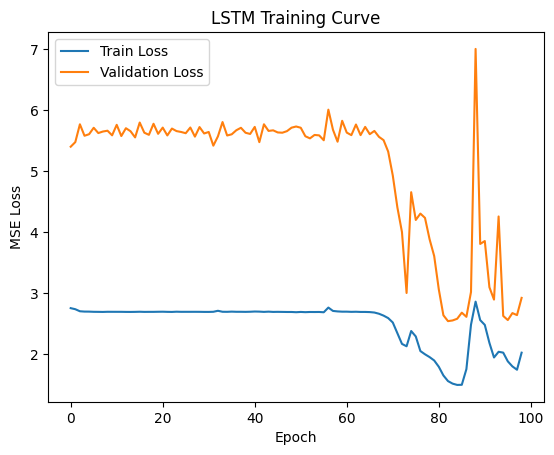

In [33]:
plot_losses(lstm_train_losses, lstm_val_losses, 'LSTM Training Curve')

In [34]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = forecast(model_lstm, X_test, y_test, device=device)

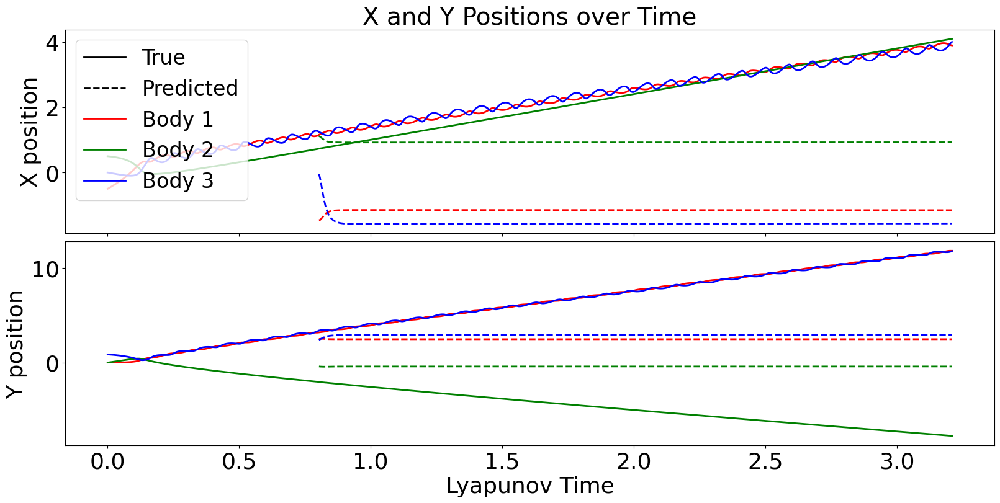

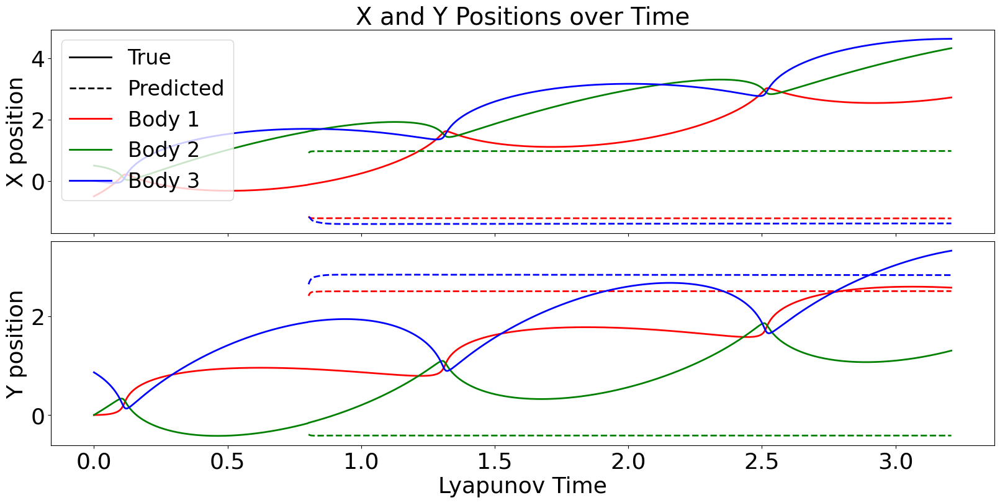

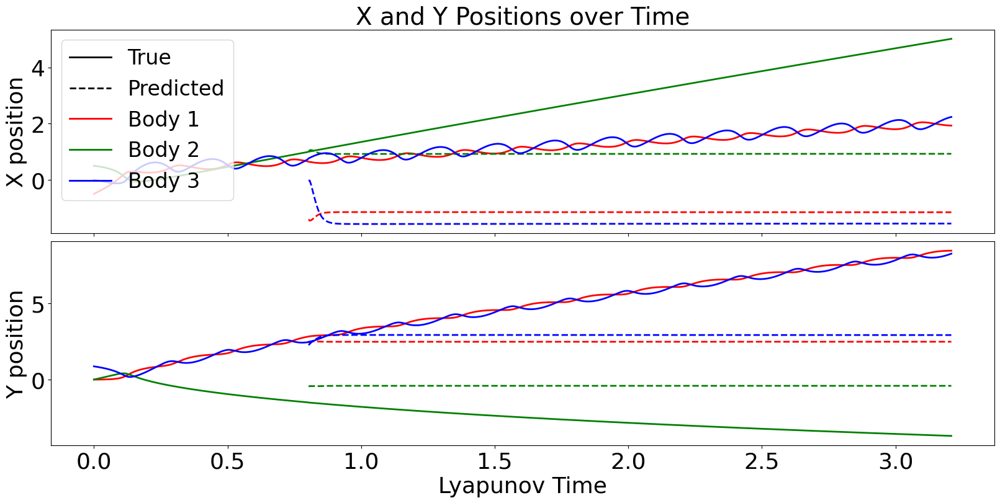

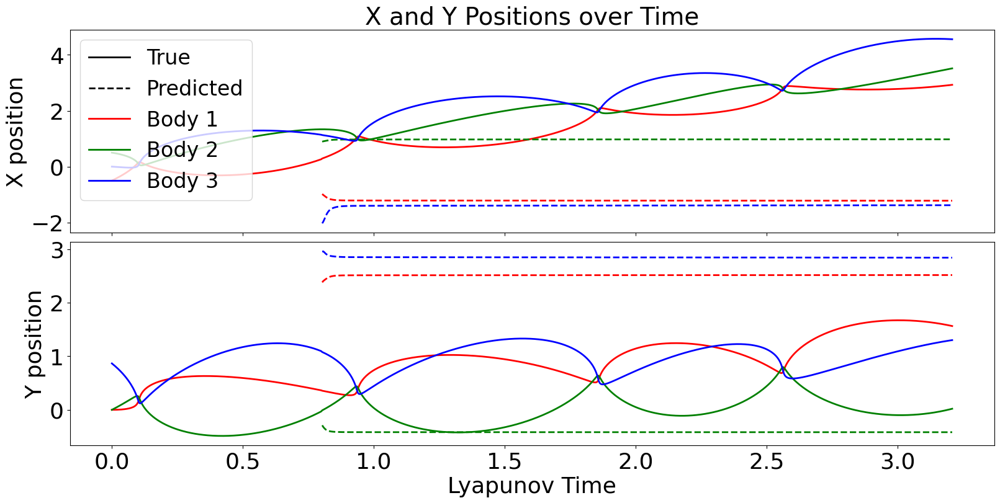

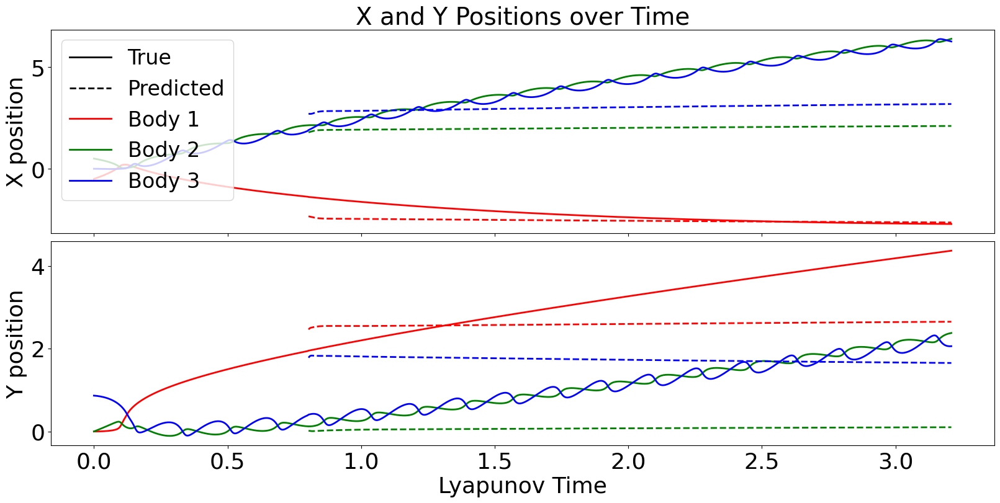

In [35]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

### Training modern TCN

In [36]:
import torch.optim as optim

# Adjust these imports based on your exact file paths
# Assuming models/ and layers/ are subdirectories of where the notebook is run
#from models.ModernTCN import Model # This imports the Model class from ModernTCN.py

# --- 1. Define the Configuration Class ---
# This class will hold all the hyperparameters, mirroring the command line arguments
class ModelConfigs:
    def __init__(self):
        # Model specific parameters from your run command
        self.patch_size = 8
        self.patch_stride = 4
        self.ffn_ratio = 8
        self.stem_ratio = 6
        self.num_blocks = [1, 1, 1, 1] # Replicate for 4 stages based on `dims`
        self.large_size = [51, 51, 51, 51] # Replicate for 4 stages
        self.small_size = [5, 5, 5, 5]   # Replicate for 4 stages
        self.dims = [64, 64, 64, 64] # Embedding dimensions for each stage (dmodel)
        self.dw_dims = [64, 64, 64, 64] # Often matches dims for consistency
        self.downsample_ratio = 2
        self.small_kernel_merged = False

        self.enc_in = 12 # Number of input variables (features M)
        self.head_dropout = 0.0
        self.dropout = 0.4 # Backbone dropout
        self.use_multi_scale = False # From the command line arg

        # RevIN parameters (often defaults or dataset-specific)
        self.revin = True
        self.affine = True
        self.subtract_last = False

        # Time features (important if you have date/time info)
        self.freq = 'h' # Example: 'h' for hourly. Adjust based on your data frequency.
                        # If you don't use time features, this might not impact model, but it's
                        # needed for the `te_patch` init in ModernTCN.
        # Data related parameters
        self.seq_len = 200 # Input sequence length
        self.pred_len = 600 # Prediction length
        self.individual = False # Whether the head predicts each variable independently
        self.kernel_size = 25 # Kernel size for series_decomp (if used)
        self.decomposition = False # Set to True if you want to enable series decomposition

        # Training parameters (from your run command)
        self.is_training = 1 # Not directly used by the Model class, but for your script logic
        self.model_id = 'weather'
        self.model = 'ModernTCN'
        self.root_path = './all_six_datasets/weather/'
        self.data_path = 'weather.csv'
        self.data = 'custom'
        self.features = 'M' # Multivariate forecasting
        self.itr = 1
        self.train_epochs = 100
        self.batch_size = 256
        self.patience = 20
        self.learning_rate = 0.0001
        self.des = 'Exp'


In [37]:
# Create an instance of the configuration class
configs = ModelConfigs()
model_moderntcn = Model(configs).to(device)
print("\nModel Architecture:")
print(model_moderntcn)


Model Architecture:
Model(
  (model): ModernTCN(
    (revin_layer): RevIN()
    (downsample_layers): ModuleList(
      (0): Sequential(
        (0): Conv1d(1, 64, kernel_size=(8,), stride=(4,))
        (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1-3): 3 x Sequential(
        (0): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (1): Conv1d(64, 64, kernel_size=(2,), stride=(2,))
      )
    )
    (te_patch): Sequential(
      (0): Conv1d(4, 4, kernel_size=(8,), stride=(4,), groups=4)
      (1): Conv1d(4, 64, kernel_size=(1,), stride=(1,))
      (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (stages): ModuleList(
      (0-3): 4 x Stage(
        (blocks): ModuleList(
          (0): Block(
            (dw): ReparamLargeKernelConv(
              (lkb_origin): Sequential(
                (conv): Conv1d(768, 768, kernel_size=(51,), stride=(1,), paddin

In [38]:
from torch.optim import lr_scheduler

# Loss function
# For time series forecasting, MSELoss (Mean Squared Error) is very common
criterion = nn.MSELoss()
tcnmodern_train_losses = []
tcnmodern_val_losses = []

In [39]:
def weighted_loss(output, target):
    position_indices = [0, 1, 4, 5, 8, 9]
    horizon = output.shape[1]
    output_positions = output[:,:,position_indices]
    target_positions = target[:,:,position_indices]
    weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)
    return (((output_positions - target_positions) ** 2) * weights).mean()


# Optimizer
# Adam is a good default choice
optimizer = optim.Adam(model_moderntcn.parameters(), lr=5e-3)

# Learning Rate Scheduler (optional, but good for fine-tuning)
# Reduces learning rate when validation loss stops improving
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

total_params = sum(p.numel() for p in model_moderntcn.parameters() if p.requires_grad)
print(f"Total trainable parameters: {total_params}")

# --- 4. Training Loop ---
num_epochs = 150 # Adjust as needed
best_val_loss = float('inf')
patience_counter = 0
early_stopping_patience = 20 # Stop if val loss doesn't improve for this many epochs

for epoch in range(num_epochs):
    start_time = time.time()
    model_moderntcn.train() # Set model to training mode
    train_loss = 0
    for batch_idx, (X_batch, y_batch) in enumerate(train_loader):
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        # Forward pass
        predictions = model_moderntcn(X_batch)
        
        # Ensure predictions and y_batch have compatible shapes for loss calculation
        # If y_batch is (batch, horizon, variables) and predictions is also (batch, horizon, variables)
        # loss = criterion(predictions, y_batch)
        loss = weighted_loss(predictions, y_batch)

        # Backward and optimize
        optimizer.zero_grad() # Clear gradients
        loss.backward()       # Compute gradients
        optimizer.step()      # Update weights

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)

    # --- Validation Loop ---
    model_moderntcn.eval() # Set model to evaluation mode
    val_loss = 0
    with torch.no_grad(): # Disable gradient calculation for validation
        for X_batch_val, y_batch_val in val_loader:
            X_batch_val, y_batch_val = X_batch_val.to(device), y_batch_val.to(device)
            val_predictions = model_moderntcn(X_batch_val)
            # v_loss = criterion(val_predictions, y_batch_val)
            v_loss = weighted_loss(val_predictions, y_batch_val)
            val_loss += v_loss.item()
    
    avg_val_loss = val_loss / len(val_loader)

    end_time = time.time()
    epoch_duration = end_time - start_time
    
    print(f"Epoch [{epoch+1}/{num_epochs}], "
          f"Train Loss: {avg_train_loss:.4f}, "
          f"Validation Loss: {avg_val_loss:.4f}, "
          f"Time: {epoch_duration:.2f}s")
    tcnmodern_train_losses.append(avg_train_loss)
    tcnmodern_val_losses.append(avg_val_loss)

    # Learning rate scheduler step
    scheduler.step(avg_val_loss)

    # Early stopping
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        # Optionally save the best model
        torch.save(model_moderntcn.state_dict(), 'best_model_moderntcn.pth')
        print("Saved best model!")
    else:
        patience_counter += 1
        if patience_counter >= early_stopping_patience:
            print(f"Early stopping triggered after {patience_counter} epochs without improvement.")
            break

print("\nTraining complete!")


Total trainable parameters: 4371028


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/150], Train Loss: 0.9740, Validation Loss: 4.0075, Time: 8.01s
Saved best model!
Epoch [2/150], Train Loss: 0.2991, Validation Loss: 1.0130, Time: 6.94s
Saved best model!
Epoch [3/150], Train Loss: 0.1826, Validation Loss: 0.8465, Time: 6.98s
Saved best model!
Epoch [4/150], Train Loss: 0.1519, Validation Loss: 0.2170, Time: 6.98s
Saved best model!
Epoch [5/150], Train Loss: 0.1227, Validation Loss: 0.2137, Time: 6.97s
Saved best model!
Epoch [6/150], Train Loss: 0.1074, Validation Loss: 0.1542, Time: 7.03s
Saved best model!
Epoch [7/150], Train Loss: 0.0922, Validation Loss: 0.1485, Time: 7.01s
Saved best model!
Epoch [8/150], Train Loss: 0.0822, Validation Loss: 0.1477, Time: 7.46s
Saved best model!
Epoch [9/150], Train Loss: 0.0764, Validation Loss: 0.1445, Time: 7.93s
Saved best model!
Epoch [10/150], Train Loss: 0.0684, Validation Loss: 0.1520, Time: 6.95s
Epoch [11/150], Train Loss: 0.0616, Validation Loss: 0.1426, Time: 6.94s
Saved best model!
Epoch [12/150], Train Loss

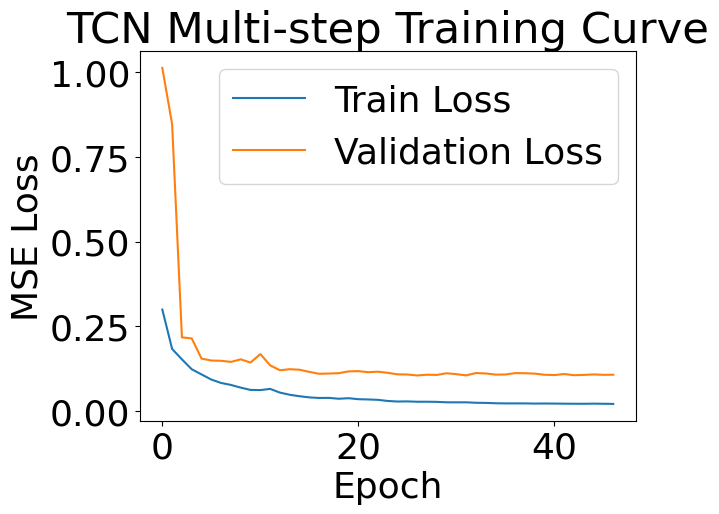

In [40]:
plot_losses(tcnmodern_train_losses, tcnmodern_val_losses, 'TCN Multi-step Training Curve')

In [41]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = forecast(model_moderntcn, X_test, y_test, device=device)

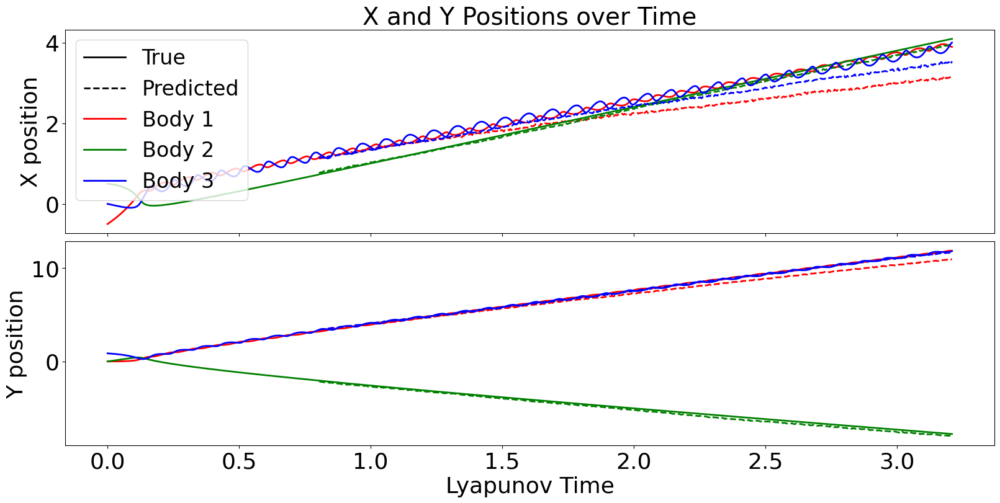

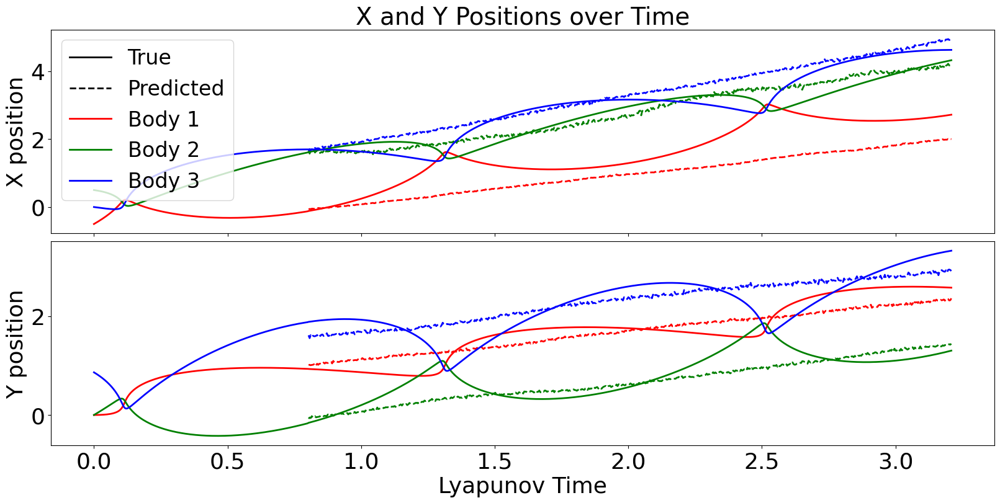

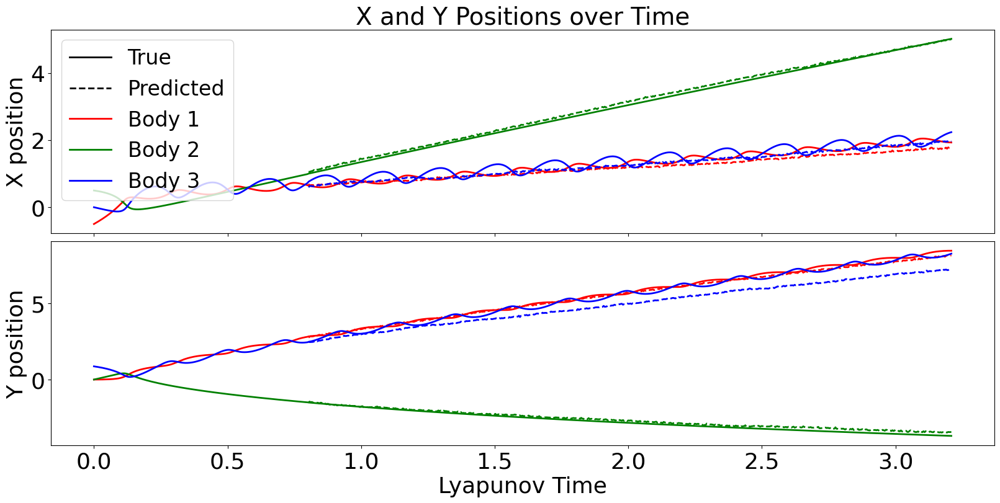

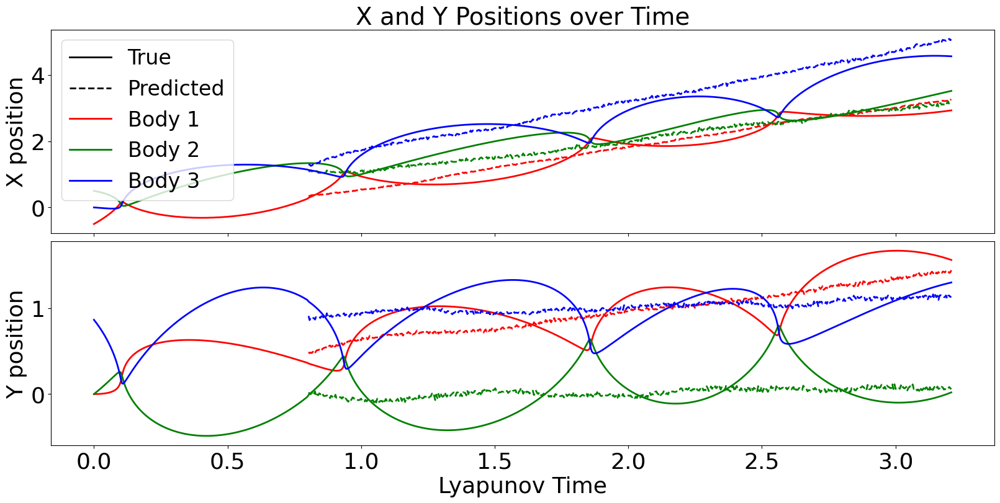

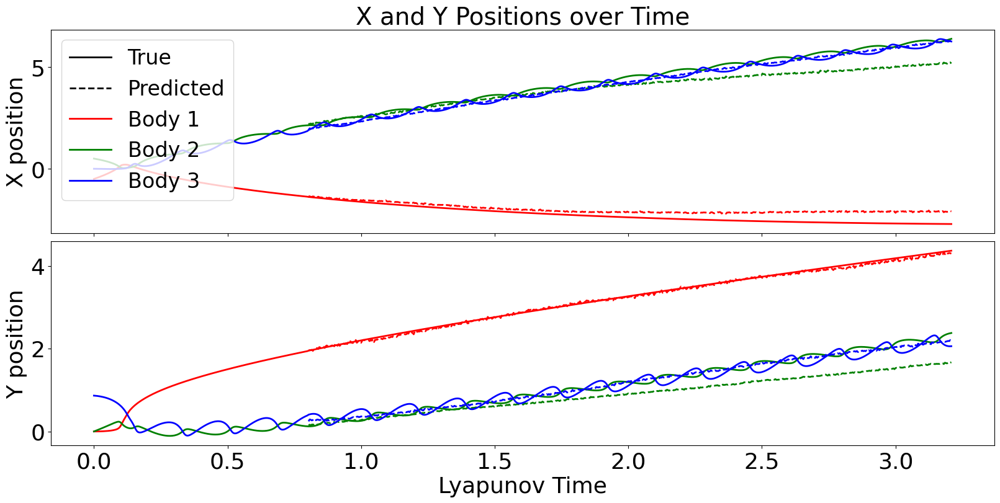

In [42]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

### Simplified ModernTCN

In [43]:
import torch.optim as optim
from torch.optim import lr_scheduler

# Model parameters (you'll need to tune these)
# These are just example values to get it running
model_params = {
    'num_variables': 12,
    'input_seq_len': 200,
    'output_horizon': 600,
    'embed_dim': 16,          # D in the paper
    'patch_size': 5,          # P in the paper (kernel size for stem)
    'stride': 1,              # S in the paper (stride for stem)
    'kernel_size': 51,         # Kernel size for DWConv
    'num_blocks': 3,          # Number of ModernTCN blocks
    'dropout_rate': 0.1,
    'expansion_ratio': 4      # r in the paper for ConvFFN
}

model_moderntcn_simple = ModernTCNsimple(**model_params).to(device)

# Loss function
# For time series forecasting, MSELoss (Mean Squared Error) is very common
criterion = nn.MSELoss()
tcnmodern_simple_train_losses = []
tcnmodern_simple_val_losses = []

In [44]:
def weighted_loss(output, target):
    position_indices = [0, 1, 4, 5, 8, 9]
    horizon = output.shape[1]
    output_positions = output[:,:,position_indices]
    target_positions = target[:,:,position_indices]
    weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)
    return (((output_positions - target_positions) ** 2) * weights).mean()


# Optimizer
# Adam is a good default choice
optimizer = optim.Adam(model_moderntcn_simple.parameters(), lr=1e-3)

# Learning Rate Scheduler (optional, but good for fine-tuning)
# Reduces learning rate when validation loss stops improving
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

print(f"\nModel Summary:\n{model_moderntcn_simple}")
total_params = sum(p.numel() for p in model_moderntcn_simple.parameters() if p.requires_grad)
print(f"Total trainable parameters: {total_params}")

# --- 4. Training Loop ---
num_epochs = 150 # Adjust as needed
best_val_loss = float('inf')
patience_counter = 0
early_stopping_patience = 20 # Stop if val loss doesn't improve for this many epochs

for epoch in range(num_epochs):
    start_time = time.time()
    model_moderntcn_simple.train() # Set model to training mode
    train_loss = 0
    for batch_idx, (X_batch, y_batch) in enumerate(train_loader):
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        # Forward pass
        predictions = model_moderntcn_simple(X_batch)
        
        # Ensure predictions and y_batch have compatible shapes for loss calculation
        # If y_batch is (batch, horizon, variables) and predictions is also (batch, horizon, variables)
        # loss = criterion(predictions, y_batch)
        loss = weighted_loss(predictions, y_batch)

        # Backward and optimize
        optimizer.zero_grad() # Clear gradients
        loss.backward()       # Compute gradients
        optimizer.step()      # Update weights

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)

    # --- Validation Loop ---
    model_moderntcn_simple.eval() # Set model to evaluation mode
    val_loss = 0
    with torch.no_grad(): # Disable gradient calculation for validation
        for X_batch_val, y_batch_val in val_loader:
            X_batch_val, y_batch_val = X_batch_val.to(device), y_batch_val.to(device)
            val_predictions = model_moderntcn_simple(X_batch_val)
            # v_loss = criterion(val_predictions, y_batch_val)
            v_loss = weighted_loss(val_predictions, y_batch_val)
            val_loss += v_loss.item()
    
    avg_val_loss = val_loss / len(val_loader)

    end_time = time.time()
    epoch_duration = end_time - start_time
    
    print(f"Epoch [{epoch+1}/{num_epochs}], "
          f"Train Loss: {avg_train_loss:.4f}, "
          f"Validation Loss: {avg_val_loss:.4f}, "
          f"Time: {epoch_duration:.2f}s")
    tcnmodern_simple_train_losses.append(avg_train_loss)
    tcnmodern_simple_val_losses.append(avg_val_loss)

    # Learning rate scheduler step
    scheduler.step(avg_val_loss)

    # Early stopping
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        # Optionally save the best model
        torch.save(model_moderntcn_simple.state_dict(), 'best_model_moderntcn_simple.pth')
        print("Saved best model!")
    else:
        patience_counter += 1
        if patience_counter >= early_stopping_patience:
            print(f"Early stopping triggered after {patience_counter} epochs without improvement.")
            break

print("\nTraining complete!")



Model Summary:
ModernTCNsimple(
  (stem): ModernTCNStem(
    (stem_conv): Conv1d(1, 16, kernel_size=(5,), stride=(1,))
  )
  (blocks): ModuleList(
    (0): ModernTCNBlock(
      (dwconv): Conv1d(192, 192, kernel_size=(51,), stride=(1,), padding=same, groups=192)
      (relu1): ReLU()
      (dropout1): Dropout(p=0.1, inplace=False)
      (convffn1_proj_in): Conv1d(192, 768, kernel_size=(1,), stride=(1,), groups=12)
      (convffn1_relu): ReLU()
      (convffn1_proj_out): Conv1d(768, 192, kernel_size=(1,), stride=(1,), groups=12)
      (dropout2): Dropout(p=0.1, inplace=False)
      (convffn2_proj_in): Conv1d(192, 768, kernel_size=(1,), stride=(1,), groups=16)
      (convffn2_relu): ReLU()
      (convffn2_proj_out): Conv1d(768, 192, kernel_size=(1,), stride=(1,), groups=16)
      (dropout3): Dropout(p=0.1, inplace=False)
      (downsample): Identity()
    )
    (1): ModernTCNBlock(
      (dwconv): Conv1d(192, 192, kernel_size=(51,), stride=(1,), padding=same, dilation=(2,), groups=192)


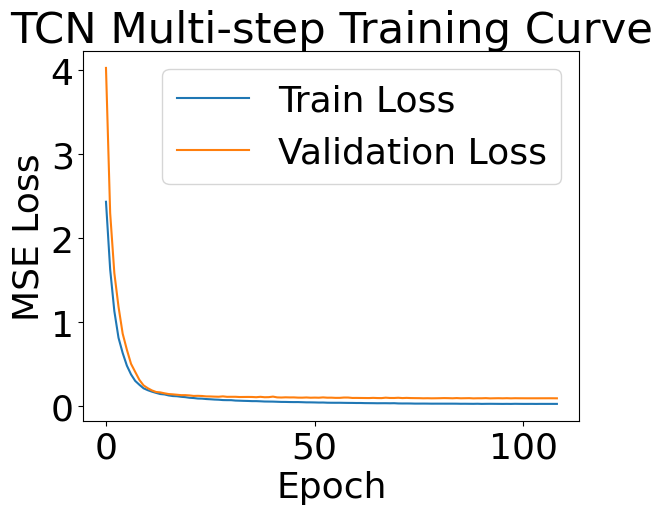

In [45]:
plot_losses(tcnmodern_simple_train_losses, tcnmodern_simple_val_losses, 'TCN Multi-step Training Curve')

In [46]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = forecast(model_moderntcn_simple, X_test, y_test, device=device)

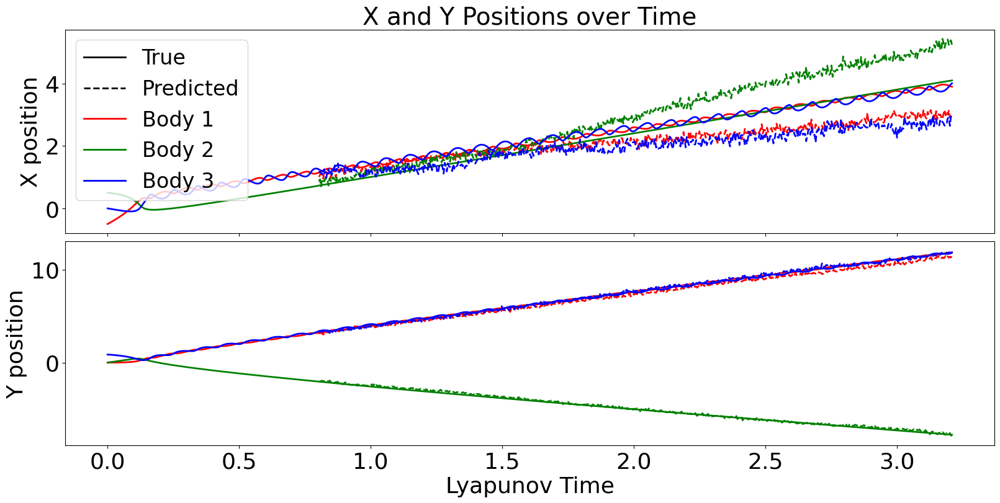

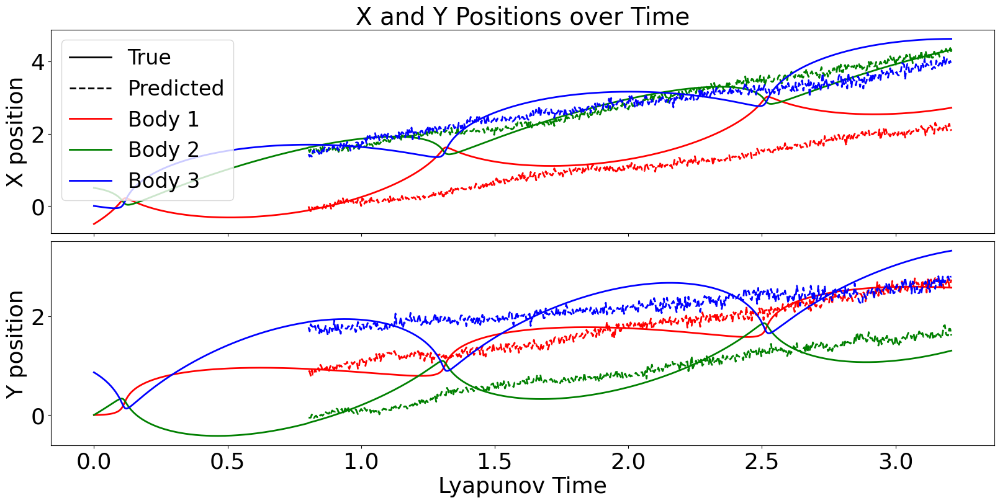

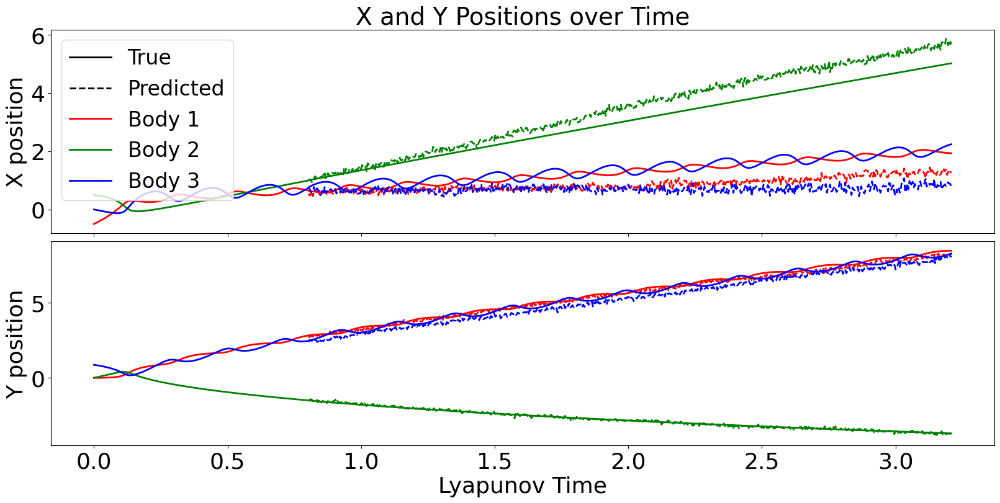

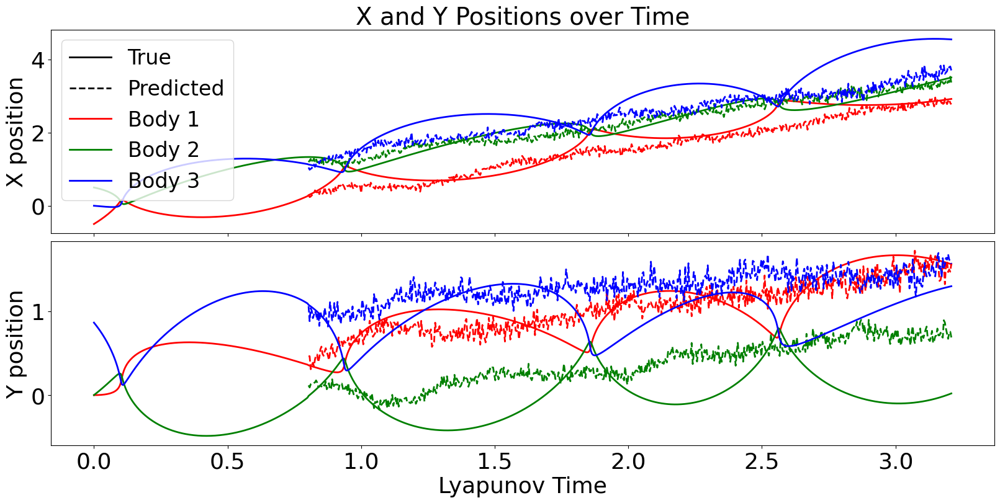

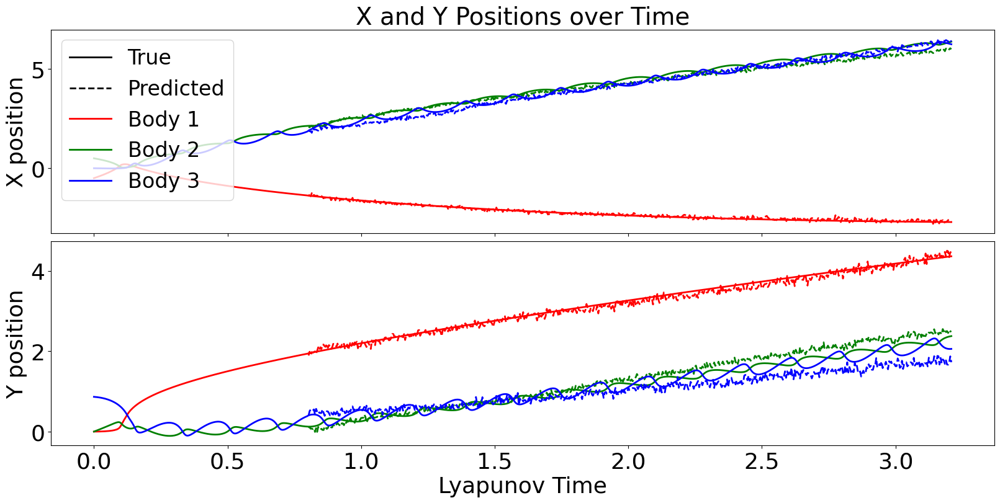

In [47]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

In [48]:
import torch.optim.lr_scheduler # Already have this imported in your notebook

model_tcn = TCN(input_size=12, output_size=12, num_channels=[256, 512, 256], forecast_horizon=horizon)
model_tcn = model_tcn.to(device)

criterion = nn.MSELoss()
tcn_train_losses = []
tcn_val_losses = []


In [49]:
def weighted_loss(output, target):
    position_indices = [0, 1, 4, 5, 8, 9]
    horizon = output.shape[1]
    output_positions = output[:,:,position_indices]
    target_positions = target[:,:,position_indices]
    weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)
    return (((output_positions - target_positions) ** 2) * weights).mean()
    
optimizer = torch.optim.Adam(model_tcn.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0=10, # Restart every 10 epochs initially
    T_mult=2, # Double the cycle length after each restart (10, 20, 40, ...)
    eta_min=0.00001 # Minimum learning rate during annealing
)
epochs = 250

for epoch in range(epochs):
    model_tcn.train()
    train_loss_epoch = 0.0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        y_pred = model_tcn(X_batch)
        loss = weighted_loss(y_pred, y_batch)
        loss.backward()
        optimizer.step()
        scheduler.step()

        train_loss_epoch += loss.item() * X_batch.size(0)

    # Average training loss for epoch
    epoch_train_loss = train_loss_epoch / len(train_loader.dataset)
    tcn_train_losses.append(epoch_train_loss)

    # Validation
    model_tcn.eval()
    val_loss_epoch = 0.0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            y_pred = model_tcn(X_batch)
            val_loss_epoch += weighted_loss(y_pred, y_batch).item() * X_batch.size(0)

    epoch_val_loss = val_loss_epoch / len(val_loader.dataset)
    tcn_val_losses.append(epoch_val_loss)

    print(f"Epoch {epoch+1}/{epochs} | Learning Rate: {optimizer.param_groups[0]['lr']:.6f} | Train Loss: {epoch_train_loss:.6f} | Val Loss: {epoch_val_loss:.6f}")


Epoch 1/250 | Learning Rate: 0.000105 | Train Loss: 3.530515 | Val Loss: 4.281726
Epoch 2/250 | Learning Rate: 0.000796 | Train Loss: 2.024449 | Val Loss: 2.218520
Epoch 3/250 | Learning Rate: 0.000214 | Train Loss: 1.012113 | Val Loss: 1.660296
Epoch 4/250 | Learning Rate: 0.000994 | Train Loss: 0.799795 | Val Loss: 1.271250
Epoch 5/250 | Learning Rate: 0.000855 | Train Loss: 0.560390 | Val Loss: 1.065942
Epoch 6/250 | Learning Rate: 0.000582 | Train Loss: 0.348417 | Val Loss: 0.614395
Epoch 7/250 | Learning Rate: 0.000280 | Train Loss: 0.259919 | Val Loss: 0.481909
Epoch 8/250 | Learning Rate: 0.000064 | Train Loss: 0.210669 | Val Loss: 0.445459
Epoch 9/250 | Learning Rate: 0.000998 | Train Loss: 0.202205 | Val Loss: 0.389836
Epoch 10/250 | Learning Rate: 0.000962 | Train Loss: 0.166671 | Val Loss: 0.445712
Epoch 11/250 | Learning Rate: 0.000881 | Train Loss: 0.159018 | Val Loss: 0.235180
Epoch 12/250 | Learning Rate: 0.000764 | Train Loss: 0.115233 | Val Loss: 0.202652
Epoch 13/250 

In [50]:
torch.save(model_tcn.state_dict(), 'model_tcn.pth')
print("Saved best model!")

Saved best model!


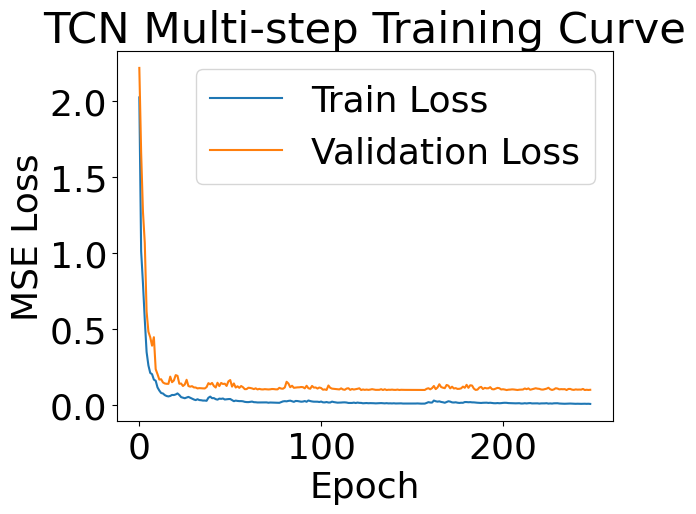

In [51]:
plot_losses(tcn_train_losses, tcn_val_losses, 'TCN Multi-step Training Curve')

In [52]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = forecast(model_tcn, X_test, y_test, device=device)

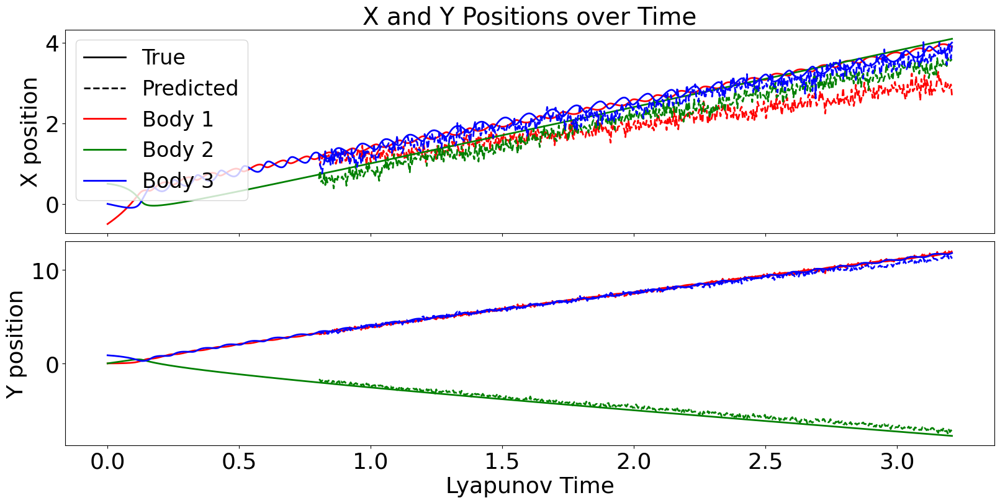

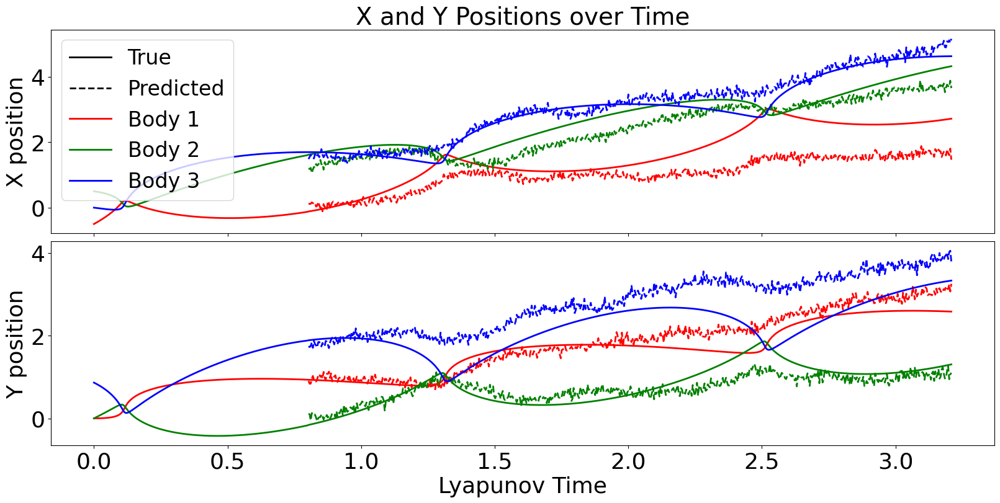

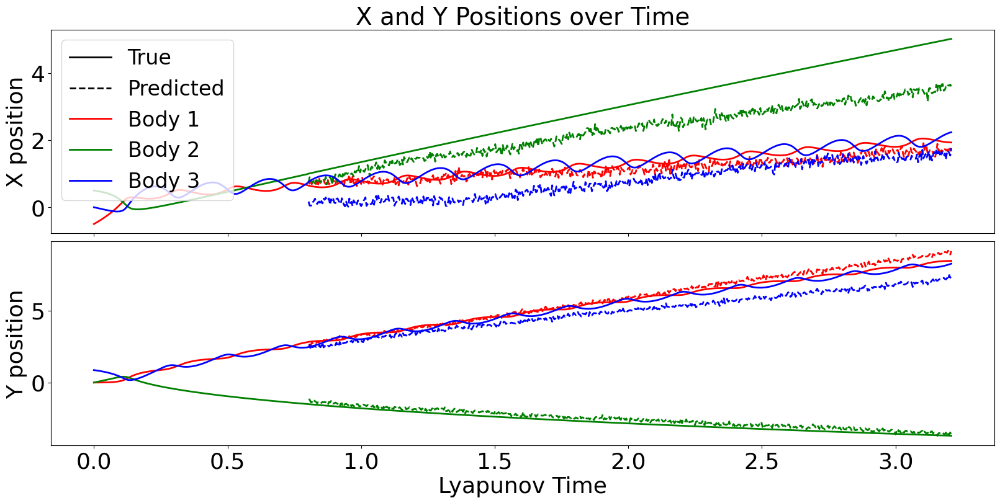

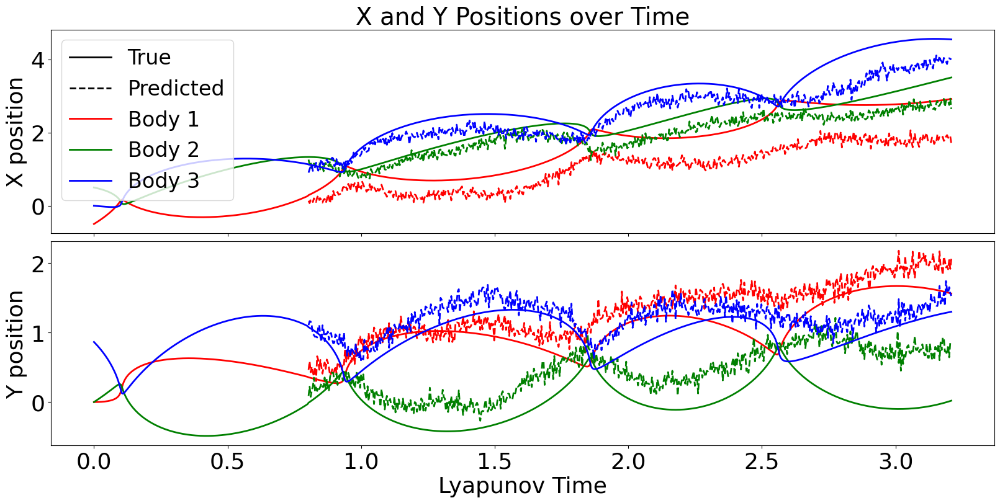

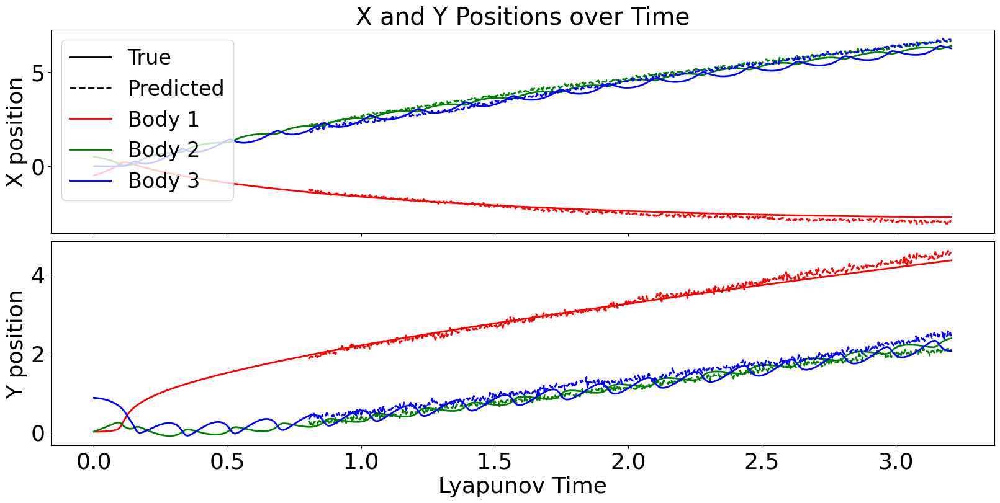

In [53]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

### Training Reservoir

In [54]:
import gc
gc.collect()
torch.cuda.empty_cache()
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |   1891 MiB |   6964 MiB |  64629 GiB |  64627 GiB |
|       from large pool |   1875 MiB |   6952 MiB |  62856 GiB |  62855 GiB |
|       from small pool |     15 MiB |    845 MiB |   1772 GiB |   1772 GiB |
|---------------------------------------------------------------------------|
| Active memory         |   1891 MiB |   6964 MiB |  64629 GiB |  64627 GiB |
|       from large pool |   1875 MiB |   6952 MiB |  62856 GiB |

In [55]:
model_reservoir = ReservoirForecast(input_size=12, reservoir_size=1750, output_size=12, alpha=0.3, ridge_lambda=2e-1, forecast_horizon=horizon, spectral_radius=0.6)
model_reservoir.to(device)

x_indices = [0, 4, 8]
y_indices = [1, 5, 9]

indices = [0, 1, 4, 5, 8, 9]
# Clone so you don't alter the original data
y_train_pos = y_train.clone()
mask = torch.ones(y_train.shape[-1], dtype=bool)
mask[indices] = False
y_train_pos[:, :, mask] = 0  # Zero out all but selected indices

# Train
model_reservoir.fit(X_train.to(device), y_train.to(device))
# Train only positions
#model_reservoir.fit(X_train.to(device), y_train_pos.to(device))

Training Weighted Loss: 0.066511


In [56]:
torch.save(model_reservoir.state_dict(), 'model_reservoir.pth')
print("Saved best model!")

Saved best model!


In [57]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = forecast(model_reservoir, X_test, y_test, device=device)

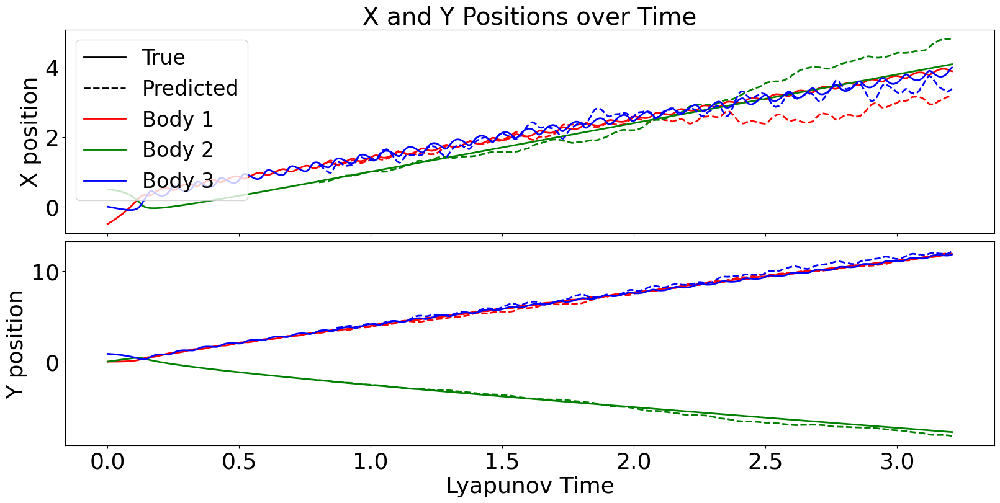

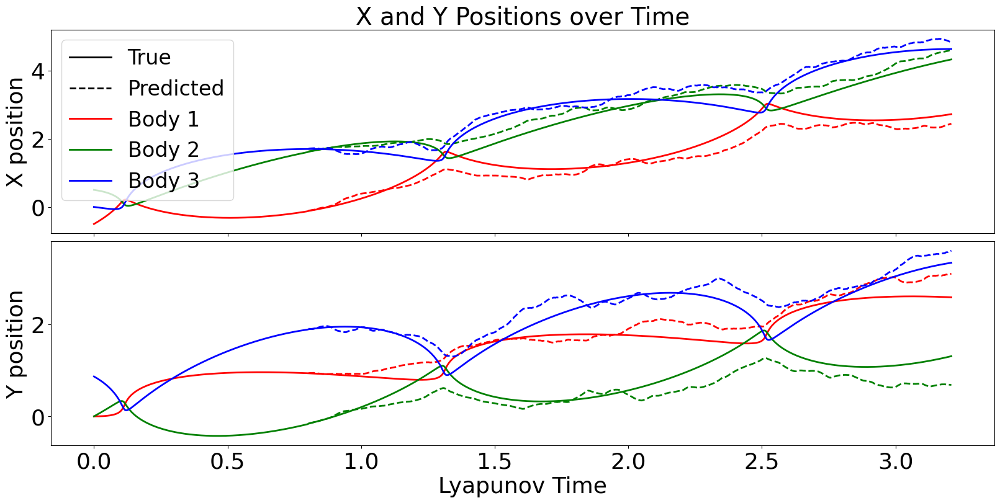

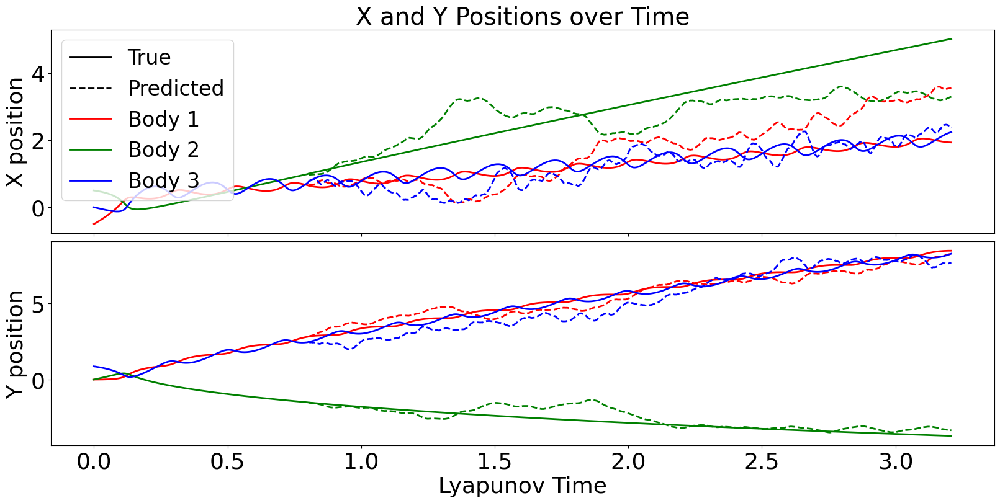

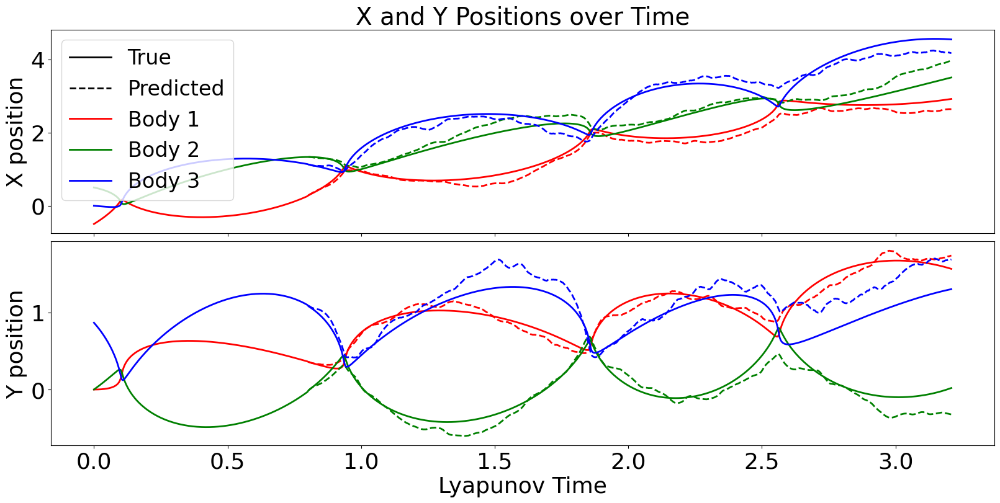

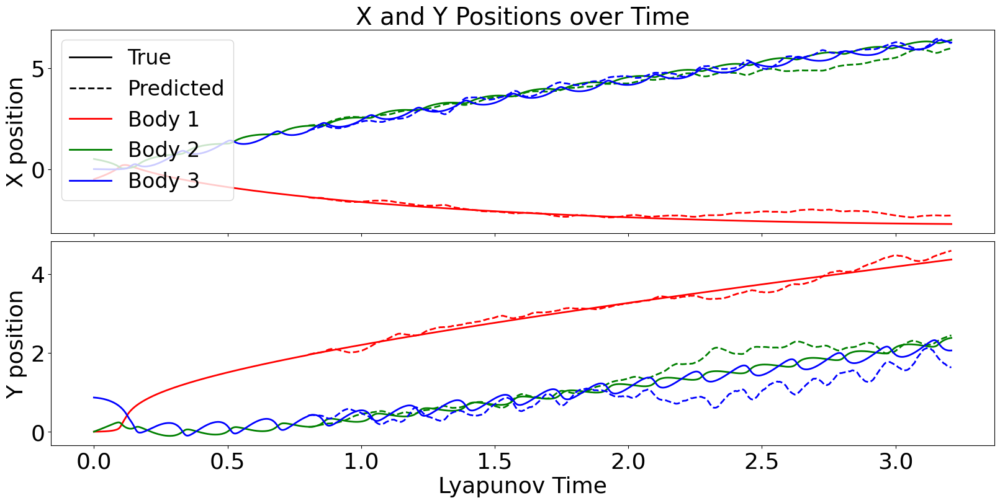

In [58]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

## Combined Reservoir and modern TCN

In [59]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F # Make sure F is imported

# --- Modify ReservoirForecast to allow training readout ---
class ReservoirForecast(nn.Module):
    def __init__(self, input_size, reservoir_size, output_size, forecast_horizon,
                 alpha=0.5, ridge_lambda=1e-2, input_scaling=0.1, density=0.1, spectral_radius=0.8):
        super().__init__()
        self.input_size = input_size
        self.reservoir_size = reservoir_size
        self.output_size = output_size
        self.horizon = forecast_horizon
        self.alpha = alpha
        self.ridge_lambda = ridge_lambda # Ridge is typically for offline fitting, less relevant for online gradient training

        # Sparse random reservoir - These remain fixed
        def sparse_random_matrix(size, density):
            mask = (torch.rand(size, size) < density).float()
            return torch.randn(size, size) * mask

        def scale_spectral_radius(W, target_radius):
            eigvals = torch.linalg.eigvals(W)
            radius = eigvals.abs().max()
            return W * (target_radius / radius)

        W_res_init = sparse_random_matrix(reservoir_size, density)
        W_res_scaled = scale_spectral_radius(W_res_init, spectral_radius)

        self.register_buffer('W_in', torch.randn(reservoir_size, input_size) * input_scaling)
        self.register_buffer('W_res', W_res_scaled)

        # Readout layer - This will be trained
        # The readout maps reservoir states to (horizon * output_size)
        self.readout = nn.Linear(reservoir_size, horizon * output_size, bias=True) # Bias is often used in readout

    def forward_reservoir(self, x):
        # Ensure buffers are on the same device as x
        self.W_in = self.W_in.to(x.device)
        self.W_res = self.W_res.to(x.device)

        batch_size, seq_len, _ = x.size()
        h = torch.zeros(batch_size, self.reservoir_size, device=x.device)

        # Process the input sequence through the reservoir dynamics
        for t in range(seq_len):
            u = x[:, t, :]
            h = (1 - self.alpha) * h + self.alpha * torch.tanh(
                F.linear(u, self.W_in) + F.linear(h, self.W_res)
            )

        return h  # shape: (batch_size, reservoir_size), the final state after processing the sequence

    def forward(self, x):
        """
        x: (batch, time, input_size)
        Returns: (batch, horizon, output_size) - Predicted residuals
        """
        # Pass input through the fixed reservoir to get the final state
        reservoir_states = self.forward_reservoir(x) # Gradients should flow here if forward_reservoir was not in no_grad

        # Pass the final reservoir state through the trainable readout layer
        predicted_residuals_flat = self.readout(reservoir_states) # (batch_size, horizon * output_size)

        # Reshape to (batch, horizon, output_size)
        predicted_residuals = predicted_residuals_flat.view(x.shape[0], self.horizon, self.output_size)

        return predicted_residuals # These are the predicted residuals

    # We remove the 'fit' method as training is done via gradient descent now
    # def fit(self, X_train, y_train): ...
    # We keep weighted_loss if you want to use it as your criterion

    def weighted_loss(self, output, target):
        """
        Calculates a weighted mean squared error loss, focusing on positions.
        Loss is higher for errors closer to the start of the forecast horizon.
        Assumes output and target are (batch, horizon, output_size=12).
        Only considers the first 6 features (x,y for 3 bodies).
        """
        # Indices for x and y positions (0, 1 for body1; 4, 5 for body2; 8, 9 for body3)
        position_indices = [0, 1, 4, 5, 8, 9]

        # Ensure output and target have the expected shape and dimensionality
        if output.shape != target.shape or output.ndim != 3 or output.shape[2] != 12:
             raise ValueError(f"Output and target must have shape (batch, horizon, 12). Got output shape {output.shape}, target shape {target.shape}")


        horizon = output.shape[1]
        # Extract only the position predictions and targets
        output_positions = output[:, :, position_indices] # (batch, horizon, 6)
        target_positions = target[:, :, position_indices] # (batch, horizon, 6)


        # Create weights that decrease linearly from 1.0 to 0.1 across the horizon
        # Weights are (1, horizon, 1) to broadcast correctly with (batch, horizon, 6)
        weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)

        # Calculate squared error for positions only
        squared_error = (output_positions - target_positions) ** 2 # (batch, horizon, 6)

        # Apply weights and calculate the mean loss across all dimensions (batch, horizon, positions)
        weighted_squared_error = squared_error * weights # (batch, horizon, 6)

        return weighted_squared_error.mean()


In [60]:
# --- Initialize both models ---
# Assume model_tcn_simple is initialized here with the correct architecture and parameters
# (e.g., using the ModernTCNsimple class and appropriate config)
# Example initialization (replace with your actual ModernTCNsimple setup):
# from your_tcn_module import ModernTCNsimple # Assuming your TCN class is in a file
class TCNConfig: # Define config if you used one
   def __init__(self):
       self.num_variables = 12
       self.input_seq_len = seq_len # Use the global seq_len
       self.output_horizon = horizon # Use the global horizon
       self.embed_dim = 64 # Example value
       self.patch_size = 8 # Example value
       self.stride = 8 # Example value
       self.kernel_size = 3 # Example value
       self.num_blocks = 3 # Example value
       self.dropout_rate = 0.1 # Example value
       self.expansion_ratio = 2 # Example value
# Create an instance of the configuration class

#configs = ModelConfigs()
#model_combined = Model(configs).to(device)

tcn_configs = TCNConfig()
model_combined = ModernTCNsimple(
   num_variables=tcn_configs.num_variables,
   input_seq_len=tcn_configs.input_seq_len,
   output_horizon=tcn_configs.output_horizon,
   embed_dim=tcn_configs.embed_dim,
   patch_size=tcn_configs.patch_size,
   stride=tcn_configs.stride,
   kernel_size=tcn_configs.kernel_size,
   num_blocks=tcn_configs.num_blocks,
   dropout_rate=tcn_configs.dropout_rate,
   expansion_ratio=tcn_configs.expansion_ratio
).to(device)

# model_combined = TCN(input_size=12, output_size=12, num_channels=[256, 512, 256], forecast_horizon=horizon).to(device)

print("\nModel Architecture:")
print(model_combined)

# Initialize the Reservoir model
# The output_size should match the residual dimensions, which is the same as the original output size (12)
reservoir_input_size = 12 # Input features per timestep for X_train
reservoir_size = 500 # Example reservoir size - needs tuning
reservoir_output_size = 12 # Predicting residuals for all 12 features
reservoir_horizon = horizon # Predicting residuals for the same horizon as TCN

model_reservoir_residual = ReservoirForecast(
    input_size=reservoir_input_size,
    reservoir_size=reservoir_size,
    output_size=reservoir_output_size,
    forecast_horizon=reservoir_horizon
).to(device)

# Store losses
joint_train_losses = []
joint_val_losses = []


Model Architecture:
ModernTCNsimple(
  (stem): ModernTCNStem(
    (stem_conv): Conv1d(1, 64, kernel_size=(8,), stride=(8,))
  )
  (blocks): ModuleList(
    (0): ModernTCNBlock(
      (dwconv): Conv1d(768, 768, kernel_size=(3,), stride=(1,), padding=same, groups=768)
      (relu1): ReLU()
      (dropout1): Dropout(p=0.1, inplace=False)
      (convffn1_proj_in): Conv1d(768, 1536, kernel_size=(1,), stride=(1,), groups=12)
      (convffn1_relu): ReLU()
      (convffn1_proj_out): Conv1d(1536, 768, kernel_size=(1,), stride=(1,), groups=12)
      (dropout2): Dropout(p=0.1, inplace=False)
      (convffn2_proj_in): Conv1d(768, 1536, kernel_size=(1,), stride=(1,), groups=64)
      (convffn2_relu): ReLU()
      (convffn2_proj_out): Conv1d(1536, 768, kernel_size=(1,), stride=(1,), groups=64)
      (dropout3): Dropout(p=0.1, inplace=False)
      (downsample): Identity()
    )
    (1): ModernTCNBlock(
      (dwconv): Conv1d(768, 768, kernel_size=(3,), stride=(1,), padding=same, dilation=(2,), group

In [61]:
def weighted_loss(output, target):
    position_indices = [0, 1, 4, 5, 8, 9]
    horizon = output.shape[1]
    output_positions = output[:,:,position_indices]
    target_positions = target[:,:,position_indices]
    weights = torch.linspace(1.0, 0.1, steps=horizon).to(output.device).unsqueeze(0).unsqueeze(-1)
    return (((output_positions - target_positions) ** 2) * weights).mean()


# You might want to initialize the readout weights/bias differently than the default PyTorch initialization

# --- Set up Optimizer ---
# We will optimize parameters of both models.
# Gather all trainable parameters
all_trainable_params = list(model_combined.parameters()) + list(model_reservoir_residual.parameters())

# Filter out parameters that require_grad=False (like the reservoir buffers)
optimizer = optim.Adam(filter(lambda p: p.requires_grad, all_trainable_params), lr=0.001)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0=10, # Restart every 10 epochs initially
    T_mult=2, # Double the cycle length after each restart (10, 20, 40, ...)
    eta_min=0.00001 # Minimum learning rate during annealing
)

# You can use the weighted_loss method from the ReservoirForecast class
criterion = model_reservoir_residual.weighted_loss # Use the instance method as the criterion

# --- Joint Training Loop ---
epochs = 350 # Set your desired number of epochs

for epoch in range(epochs):
    model_combined.train() # Set TCN to training mode
    model_reservoir_residual.train() # Set Reservoir to training mode (only readout trains)
    train_loss = 0.0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()

        # TCN Prediction
        tcn_pred = model_combined(X_batch)

        # Reservoir Residual Prediction
        # Pass the same input through the reservoir
        reservoir_residual_pred = model_reservoir_residual(X_batch)

        # Combined Prediction
        combined_pred = tcn_pred + reservoir_residual_pred

        # Calculate Loss using the combined prediction
        #loss = criterion(combined_pred, y_batch)
        loss = weighted_loss(combined_pred, y_batch)

        # Backpropagate and Optimize
        loss.backward()
        optimizer.step()
        scheduler.step()

        train_loss += loss.item() * X_batch.size(0)

    avg_train_loss = train_loss / len(train_loader.dataset)
    joint_train_losses.append(avg_train_loss)

    # Validation
    model_combined.eval() # Set TCN to evaluation mode
    model_reservoir_residual.eval() # Set Reservoir to evaluation mode (dropout/batchnorm disabled if present, readout still uses learned weights)
    val_loss = 0.0
    with torch.no_grad(): # No gradient calculation during validation
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)

            # TCN Prediction
            tcn_pred = model_combined(X_batch)

            # Reservoir Residual Prediction
            reservoir_residual_pred = model_reservoir_residual(X_batch)

            # Combined Prediction
            combined_pred = tcn_pred + reservoir_residual_pred

            # Calculate Loss
            #loss = criterion(combined_pred, y_batch)
            loss = weighted_loss(combined_pred, y_batch)
            val_loss += loss.item() * X_batch.size(0)

    avg_val_loss = val_loss / len(val_loader.dataset)
    joint_val_losses.append(avg_val_loss)
    
    print(f"Epoch {epoch+1}/{epochs} | Learning Rate: {optimizer.param_groups[0]['lr']:.6f} | Joint Train Loss: {avg_train_loss:.6f} | Joint Val Loss: {avg_val_loss:.6f}")

# Optionally save both models
torch.save(model_combined.state_dict(), 'model_tcn_simple_joint.pth')
torch.save(model_reservoir_residual.state_dict(), 'model_reservoir_joint.pth')
print("Saved joint models!")

Epoch 1/350 | Learning Rate: 0.000105 | Joint Train Loss: 2.650773 | Joint Val Loss: 3.302883
Epoch 2/350 | Learning Rate: 0.000796 | Joint Train Loss: 1.382318 | Joint Val Loss: 1.602235
Epoch 3/350 | Learning Rate: 0.000214 | Joint Train Loss: 0.807383 | Joint Val Loss: 1.152255
Epoch 4/350 | Learning Rate: 0.000994 | Joint Train Loss: 0.645879 | Joint Val Loss: 0.896204
Epoch 5/350 | Learning Rate: 0.000855 | Joint Train Loss: 0.481533 | Joint Val Loss: 0.588415
Epoch 6/350 | Learning Rate: 0.000582 | Joint Train Loss: 0.343843 | Joint Val Loss: 0.402728
Epoch 7/350 | Learning Rate: 0.000280 | Joint Train Loss: 0.277608 | Joint Val Loss: 0.353138
Epoch 8/350 | Learning Rate: 0.000064 | Joint Train Loss: 0.248118 | Joint Val Loss: 0.333763
Epoch 9/350 | Learning Rate: 0.000998 | Joint Train Loss: 0.240274 | Joint Val Loss: 0.304850
Epoch 10/350 | Learning Rate: 0.000962 | Joint Train Loss: 0.212529 | Joint Val Loss: 0.238336
Epoch 11/350 | Learning Rate: 0.000881 | Joint Train Loss: 

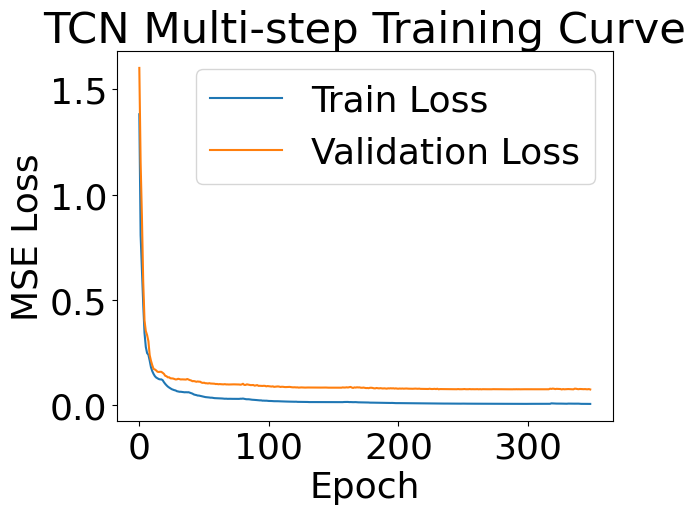

In [62]:
plot_losses(joint_train_losses, joint_val_losses, 'TCN Multi-step Training Curve')

In [63]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = combined_forecast(model_combined, model_reservoir_residual, X_test, y_test, device=device)

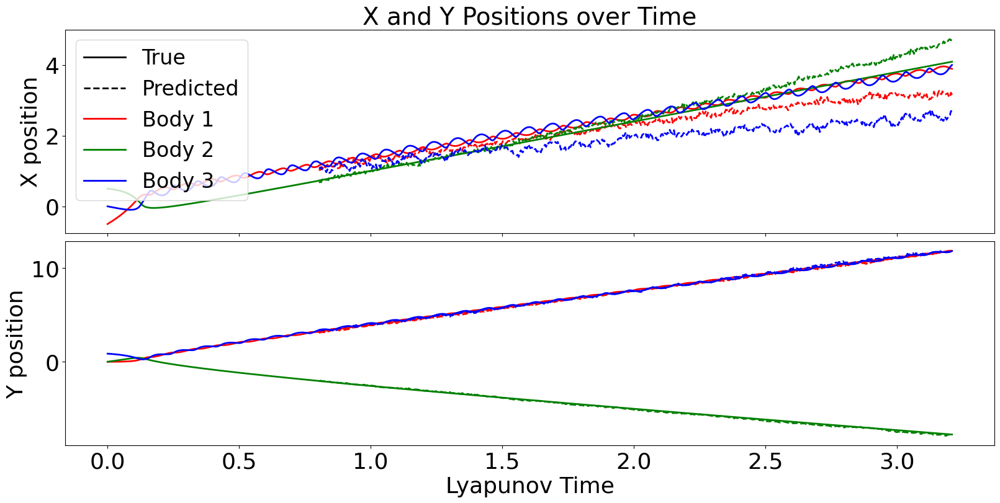

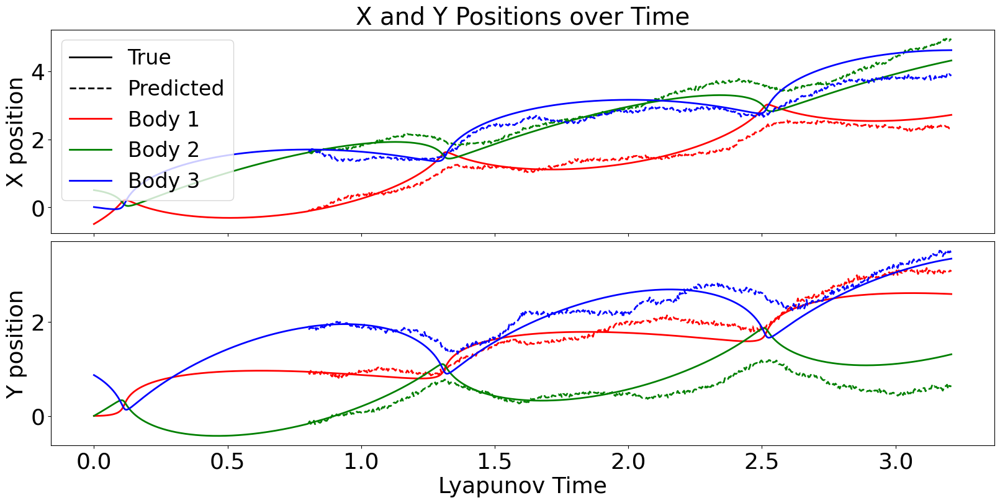

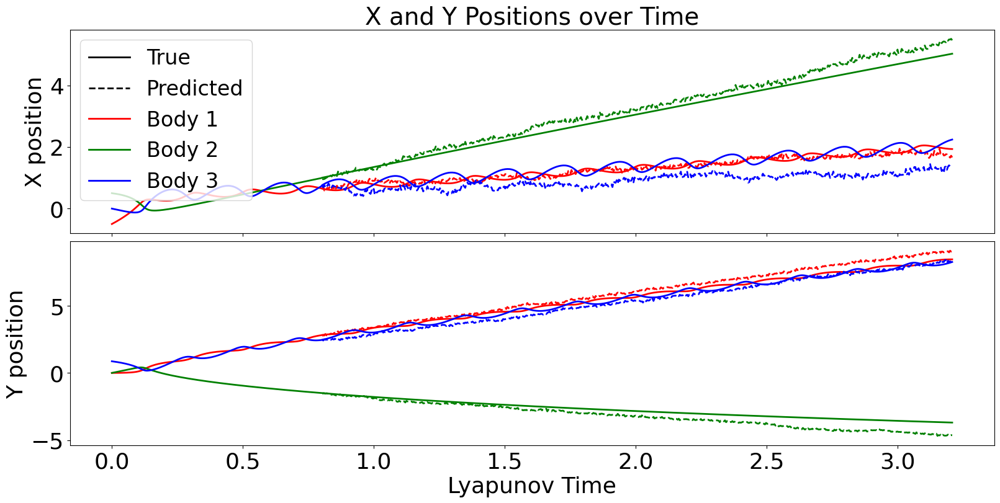

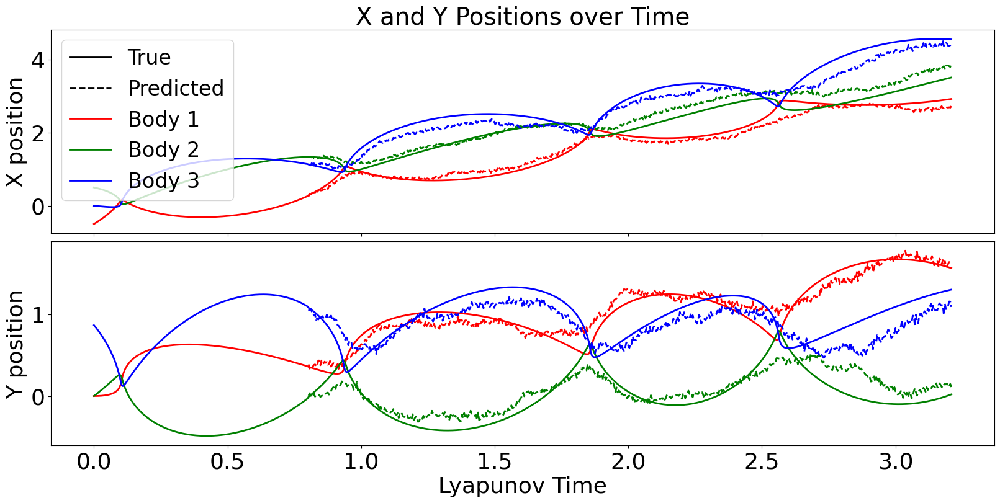

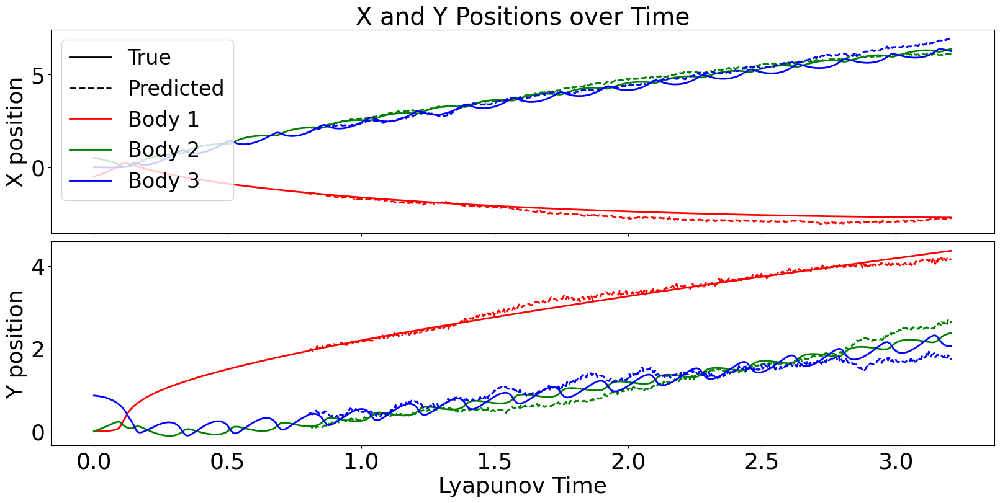

In [64]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

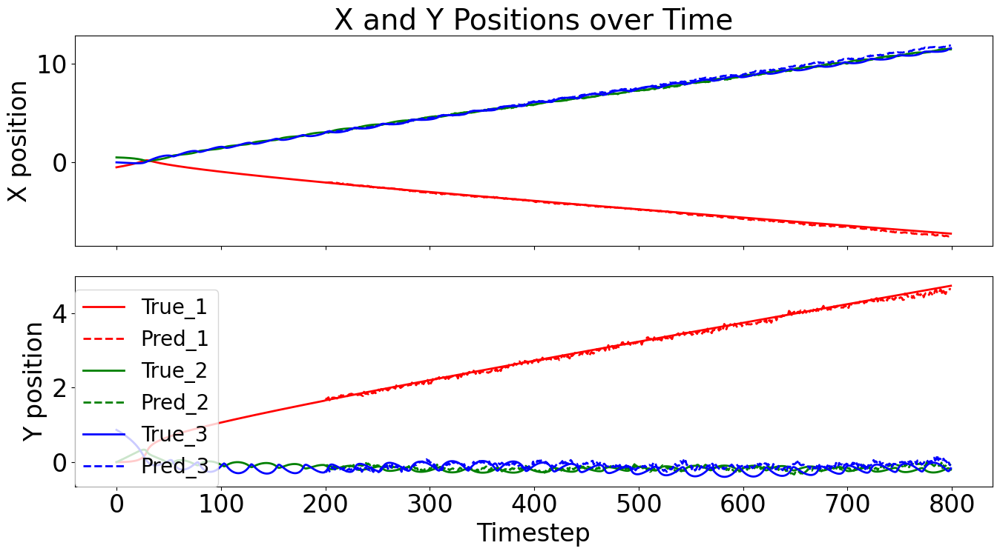

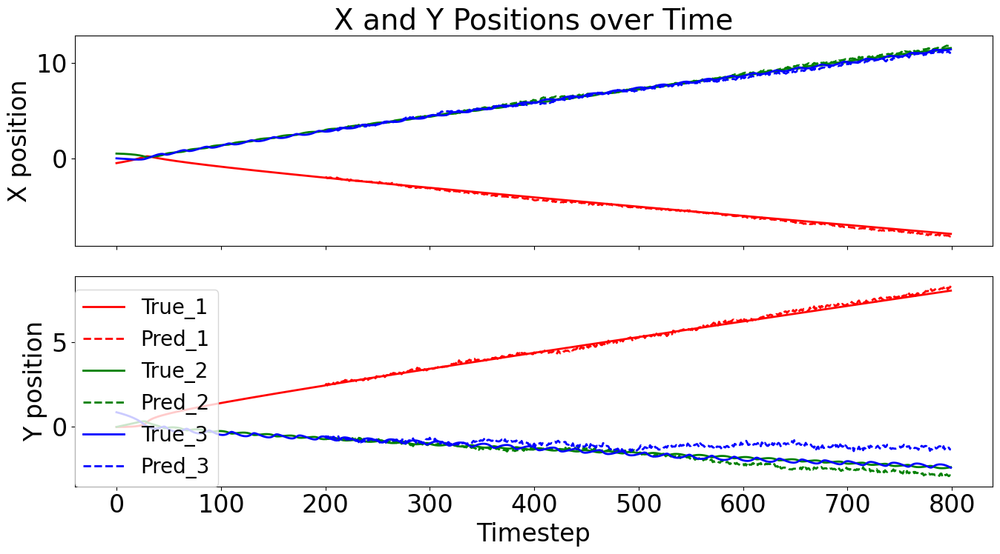

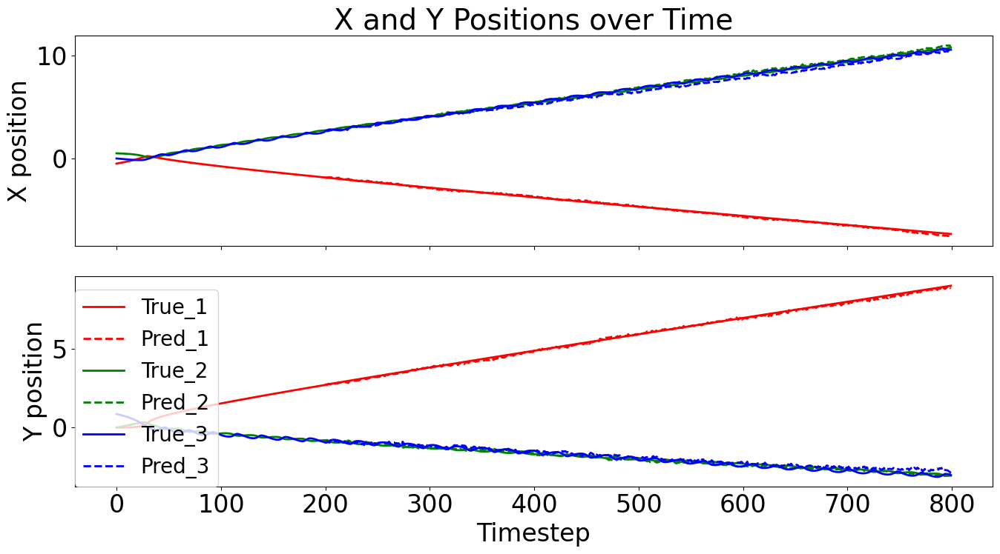

In [65]:
# Plot a sample
for i in range(3):
    plot_predictions(X_val_orig[:,:,:], y_val_orig, y_pred_val_orig, sequence_idx=i+131)


In [66]:
# Get predictions
X_val_orig, y_val_orig, y_pred_val_orig = forecast(model_reservoir, X_val, y_val, device=device)

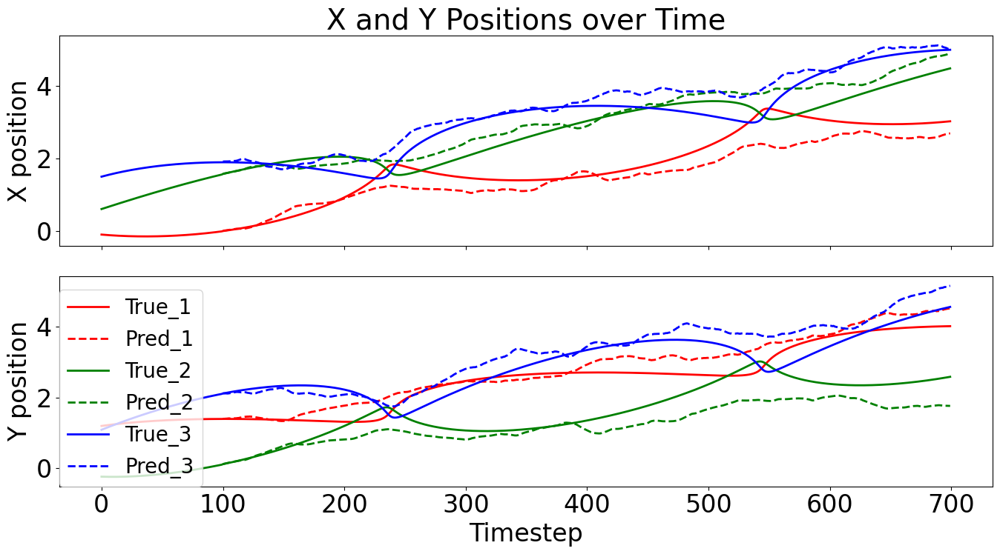

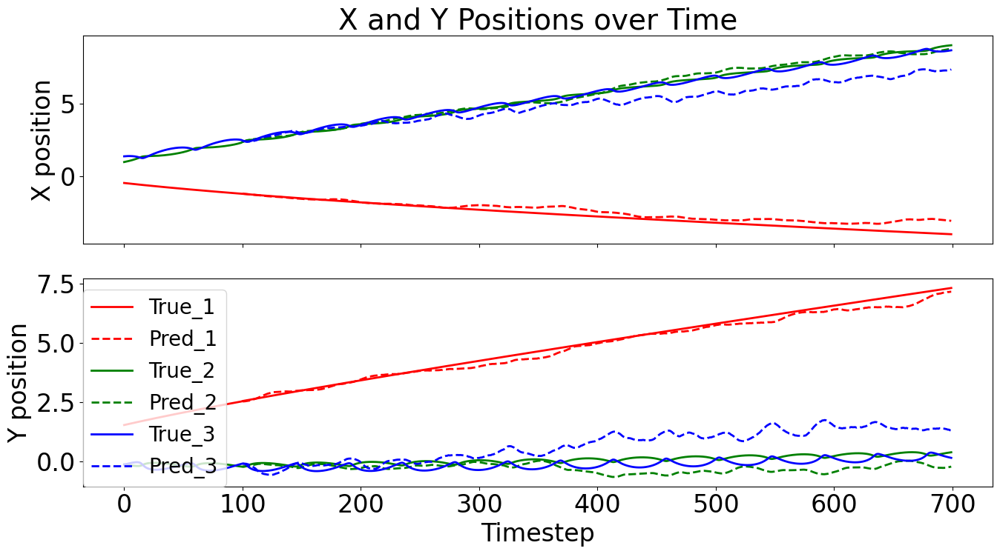

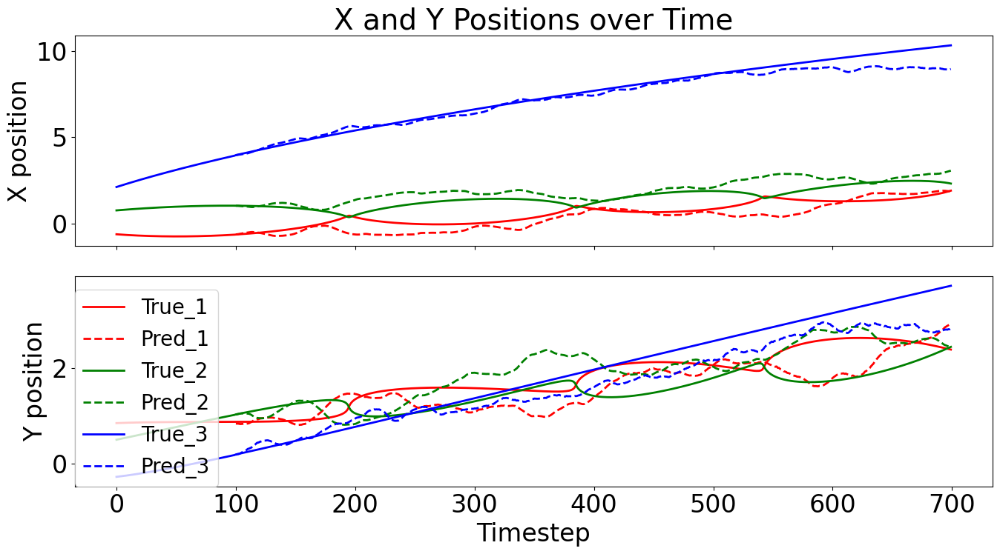

In [67]:
# Plot a sample
for i in range(3):
    plot_predictions(X_val_orig[:,100:,:], y_val_orig, y_pred_val_orig, sequence_idx=i+110)


In [68]:
## Calculate RMSE for different horizons

import numpy as np
import torch

def calculate_rmse(predictions, targets):
    """
    Calculates the Root Mean Squared Error between predictions and targets.

    Args:
        predictions (np.array): Predicted values.
        targets (np.array): True values.

    Returns:
        float: The RMSE.
    """
    # Ensure predictions and targets have the same shape
    if predictions.shape != targets.shape:
        raise ValueError("Predictions and targets must have the same shape.")

    mse = np.mean((predictions - targets) ** 2)
    rmse = np.sqrt(mse)
    return rmse

def calculate_position_rmse_at_horizons(y_pred, y_true, horizons, x_indices, y_indices):
    """
    Calculates RMSE for x and y positions at specified forecast horizons.

    Args:
        y_pred (np.array): Predicted data (batch_size, forecast_horizon, features).
        y_true (np.array): True data (batch_size, forecast_horizon, features).
        horizons (list): List of horizon values (integers) to calculate RMSE for.
        x_indices (list): Indices of the x-position features in the feature dimension.
        y_indices (list): Indices of the y-position features in the feature dimension.

    Returns:
        dict: A dictionary where keys are horizons and values are dictionaries
              containing 'x_rmse' and 'y_rmse'.
    """
    results = {}

    # Ensure y_pred and y_true cover the maximum required horizon
    max_horizon = max(horizons)
    if y_pred.shape[1] < max_horizon or y_true.shape[1] < max_horizon:
        raise ValueError(f"Predicted/True data horizon ({y_pred.shape[1]}) is less than the maximum requested horizon ({max_horizon}).")

    for horizon in horizons:
        if horizon == 0:
            # RMSE at horizon 0 (start of prediction)
            # This would be the error between the last point of the input
            # and the first point of the true horizon.
            # For simplicity here, we'll assume horizon starts at index 1 of prediction.
            # If you need error at the exact transition, you'd use the last point
            # of X_val_orig and the first point of y_val_orig.
            # We will skip horizon 0 for RMSE on the *forecast*.
            continue

        # Select data up to the current horizon
        y_pred_h = y_pred[:, :horizon, :]
        y_true_h = y_true[:, :horizon, :]

        # Extract x and y positions
        y_pred_x = y_pred_h[:, :, x_indices]
        y_true_x = y_true_h[:, :, x_indices]
        y_pred_y = y_pred_h[:, :, y_indices]
        y_true_y = y_true_h[:, :, y_indices]

        # Calculate RMSE for x and y positions across all bodies and batches
        x_rmse = calculate_rmse(y_pred_x, y_true_x)
        y_rmse = calculate_rmse(y_pred_y, y_true_y)

        results[horizon] = {'x_rmse': x_rmse, 'y_rmse': y_rmse}

    return results



In [69]:
def calculate_position_rmse_at_horizons(y_pred, y_true, horizons, x_indices, y_indices):
    """
    Calculates RMSE for x, y positions and Euclidean distance at specified forecast horizons.

    Args:
        y_pred (np.array): Predicted data (batch_size, forecast_horizon, features).
        y_true (np.array): True data (batch_size, forecast_horizon, features).
        horizons (list): List of horizon values (integers) to calculate RMSE for.
        x_indices (list): Indices of the x-position features in the feature dimension.
        y_indices (list): Indices of the y-position features in the feature dimension.

    Returns:
        dict: A dictionary where keys are horizons and values are dictionaries
              containing 'x_rmse', 'y_rmse', and 'distance_rmse'.
    """
    results = {}

    max_horizon = max(horizons)
    if y_pred.shape[1] < max_horizon or y_true.shape[1] < max_horizon:
        raise ValueError(f"Predicted/True data horizon ({y_pred.shape[1]}) is less than the maximum requested horizon ({max_horizon}).")

    for horizon in horizons:
        if horizon == 0:
            continue  # Skip horizon 0

        # Slice up to current horizon
        y_pred_h = y_pred[:, :horizon, :]
        y_true_h = y_true[:, :horizon, :]

        # Extract x and y positions
        y_pred_x = y_pred_h[:, :, x_indices]
        y_true_x = y_true_h[:, :, x_indices]
        y_pred_y = y_pred_h[:, :, y_indices]
        y_true_y = y_true_h[:, :, y_indices]

        # Compute RMSE for x and y positions
        x_rmse = calculate_rmse(y_pred_x, y_true_x)
        y_rmse = calculate_rmse(y_pred_y, y_true_y)

        # Compute Euclidean distance RMSE
        pred_distance = np.sqrt((y_pred_x - y_true_x)**2 + (y_pred_y - y_true_y)**2)
        distance_rmse = np.sqrt(np.mean(pred_distance**2))  # or just use calculate_rmse(pred_distance, np.zeros_like(pred_distance))

        results[horizon] = {
            'x_rmse': x_rmse,
            'y_rmse': y_rmse,
            'distance_rmse': distance_rmse
        }

    return results


In [70]:
_, y_val_orig, y_pred_val_reservoir = forecast(model_reservoir, X_val, y_val, device=device)
_, y_val_orig, y_pred_val_lstm = forecast(model_lstm, X_val, y_val, device=device)
_, y_val_orig, y_pred_val_tcn = forecast(model_tcn, X_val, y_val, device=device)
_, y_val_orig, y_pred_val_tcnmodern = forecast(model_moderntcn, X_val, y_val, device=device)
_, y_val_orig, y_pred_val_tcnmodern_simple = forecast(model_moderntcn_simple, X_val, y_val, device=device)
_, y_val_orig, y_pred_val_combined = combined_forecast(model_combined, model_reservoir_residual, X_val, y_val, device=device)

In [71]:
# Define the horizons you want to evaluate
evaluation_horizons = [1, 25, 50, 100, 200, 600] # Note: Max horizon in your current y_val_orig is 50

# Define indices for x and y positions
x_indices = [0, 4, 8]
y_indices = [1, 5, 9]

# Calculate RMSE for each model
print("Calculating RMSE for Reservoir Model...")
reservoir_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_val_reservoir,
    y_val_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for LSTM Model...")
lstm_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_val_lstm,
    y_val_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for TCN Model...")
tcn_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_val_tcn,
    y_val_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

# Print the results
print("\n--- RMSE Results ---")

print("\nReservoir Model:")
for horizon, rmse_values in reservoir_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

print("\nLSTM Model:")
for horizon, rmse_values in lstm_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

print("\nTCN Model:")
for horizon, rmse_values in tcn_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

Calculating RMSE for Reservoir Model...

Calculating RMSE for LSTM Model...

Calculating RMSE for TCN Model...

--- RMSE Results ---

Reservoir Model:
  Horizon 1: x_rmse = 0.0221, y_rmse = 0.0237
  Horizon 25: x_rmse = 0.0806, y_rmse = 0.1148
  Horizon 50: x_rmse = 0.1032, y_rmse = 0.1590
  Horizon 100: x_rmse = 0.1640, y_rmse = 0.1841
  Horizon 200: x_rmse = 0.2679, y_rmse = 0.2652
  Horizon 600: x_rmse = 0.5574, y_rmse = 0.6540

LSTM Model:
  Horizon 1: x_rmse = 1.1734, y_rmse = 1.2815
  Horizon 25: x_rmse = 1.2374, y_rmse = 1.3355
  Horizon 50: x_rmse = 1.3047, y_rmse = 1.3595
  Horizon 100: x_rmse = 1.4249, y_rmse = 1.3938
  Horizon 200: x_rmse = 1.6899, y_rmse = 1.5080
  Horizon 600: x_rmse = 3.1305, y_rmse = 2.3160

TCN Model:
  Horizon 1: x_rmse = 0.1738, y_rmse = 0.1642
  Horizon 25: x_rmse = 0.1791, y_rmse = 0.1635
  Horizon 50: x_rmse = 0.1855, y_rmse = 0.1679
  Horizon 100: x_rmse = 0.2161, y_rmse = 0.1744
  Horizon 200: x_rmse = 0.2713, y_rmse = 0.2363
  Horizon 600: x_rms

In [72]:
_, y_test_orig, y_pred_test_reservoir = forecast(model_reservoir, X_test, y_test, device=device)
_, y_test_orig, y_pred_test_lstm = forecast(model_lstm, X_test, y_test, device=device)
_, y_test_orig, y_pred_test_tcn = forecast(model_tcn, X_test, y_test, device=device)
_, y_test_orig, y_pred_test_tcnmodern = forecast(model_moderntcn, X_test, y_test, device=device)
_, y_test_orig, y_pred_test_tcnmodern_simple = forecast(model_moderntcn_simple, X_test, y_test, device=device)
_, y_test_orig, y_pred_test_combined = combined_forecast(model_combined, model_reservoir_residual, X_test, y_test, device=device)

In [73]:
# Define the horizons you want to evaluate
evaluation_horizons = [1, 25, 50, 100, 200, 600] # Note: Max horizon in your current y_val_orig is 50

# Define indices for x and y positions
x_indices = [0, 4, 8]
y_indices = [1, 5, 9]

# Calculate RMSE for each model
print("Calculating RMSE for Reservoir Model...")
reservoir_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_test_reservoir,
    y_test_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for LSTM Model...")
lstm_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_test_lstm,
    y_test_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for TCN Model...")
tcn_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_test_tcn,
    y_test_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for TCNModern Model...")
tcnmodern_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_test_tcnmodern,
    y_test_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for Simple TCNModern Model...")
tcnmodern_simple_rmse_results = calculate_position_rmse_at_horizons(
    y_pred_test_tcnmodern_simple,
    y_test_orig,
    evaluation_horizons,
    x_indices,
    y_indices
)

# Print the results
print("\n--- RMSE Results ---")

print("\nReservoir Model:")
for horizon, rmse_values in reservoir_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

print("\nLSTM Model:")
for horizon, rmse_values in lstm_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

print("\nTCN Model:")
for horizon, rmse_values in tcn_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

print("\nModernTCN Model:")
for horizon, rmse_values in tcnmodern_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

print("\nSimple ModernTCN Model:")
for horizon, rmse_values in tcnmodern_simple_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, y_rmse = {rmse_values['y_rmse']:.4f}")

Calculating RMSE for Reservoir Model...

Calculating RMSE for LSTM Model...

Calculating RMSE for TCN Model...

Calculating RMSE for TCNModern Model...

Calculating RMSE for Simple TCNModern Model...

--- RMSE Results ---

Reservoir Model:
  Horizon 1: x_rmse = 0.0259, y_rmse = 0.0277
  Horizon 25: x_rmse = 0.0993, y_rmse = 0.1400
  Horizon 50: x_rmse = 0.1277, y_rmse = 0.1960
  Horizon 100: x_rmse = 0.1946, y_rmse = 0.2280
  Horizon 200: x_rmse = 0.3253, y_rmse = 0.3221
  Horizon 600: x_rmse = 0.6990, y_rmse = 0.7893

LSTM Model:
  Horizon 1: x_rmse = 1.1437, y_rmse = 1.2826
  Horizon 25: x_rmse = 1.2321, y_rmse = 1.3414
  Horizon 50: x_rmse = 1.3055, y_rmse = 1.3717
  Horizon 100: x_rmse = 1.4342, y_rmse = 1.4233
  Horizon 200: x_rmse = 1.7067, y_rmse = 1.5687
  Horizon 600: x_rmse = 3.1657, y_rmse = 2.4926

TCN Model:
  Horizon 1: x_rmse = 0.1982, y_rmse = 0.1932
  Horizon 25: x_rmse = 0.2093, y_rmse = 0.1923
  Horizon 50: x_rmse = 0.2161, y_rmse = 0.1969
  Horizon 100: x_rmse = 0.2

In [74]:
# Define the horizons you want to evaluate
evaluation_horizons = [1, 25, 50, 100, 200, 600] # Note: Max horizon in your current y_val_orig is 50

# Define indices for x and y positions
x_indices = [0, 4, 8]
y_indices = [1, 5, 9]

# Calculate RMSE for each model
print("Calculating RMSE for Reservoir Model...")
reservoir_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_reservoir,y_pred_test_reservoir]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for LSTM Model...")
lstm_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_lstm,y_pred_test_lstm]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for TCN Model...")
tcn_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_tcn,y_pred_test_tcn]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for TCNModern Model...")
tcnmodern_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_tcnmodern,y_pred_test_tcnmodern]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for Simple TCNModern Model...")
tcnmodern_simple_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_tcnmodern_simple,y_pred_test_tcnmodern_simple]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCalculating RMSE for Combined Model...")
combined_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_combined,y_pred_test_combined]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

# Print the results
print("\n--- RMSE Results ---")

print("\nReservoir Model:")
for horizon, rmse_values in reservoir_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")

print("\nLSTM Model:")
for horizon, rmse_values in lstm_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")

print("\nTCN Model:")
for horizon, rmse_values in tcn_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")

print("\nModernTCN Model:")
for horizon, rmse_values in tcnmodern_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")

print("\nSimple ModernTCN Model:")
for horizon, rmse_values in tcnmodern_simple_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")

print("\nCombined Model:")
for horizon, rmse_values in combined_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")


Calculating RMSE for Reservoir Model...

Calculating RMSE for LSTM Model...

Calculating RMSE for TCN Model...

Calculating RMSE for TCNModern Model...

Calculating RMSE for Simple TCNModern Model...

Calculating RMSE for Combined Model...

--- RMSE Results ---

Reservoir Model:
  Horizon 1: x_rmse = 0.0241, y_rmse = 0.0257, distance_rmse = 0.0353
  Horizon 25: x_rmse = 0.0904, y_rmse = 0.1280, distance_rmse = 0.1568
  Horizon 50: x_rmse = 0.1161, y_rmse = 0.1785, distance_rmse = 0.2129
  Horizon 100: x_rmse = 0.1800, y_rmse = 0.2073, distance_rmse = 0.2745
  Horizon 200: x_rmse = 0.2981, y_rmse = 0.2951, distance_rmse = 0.4194
  Horizon 600: x_rmse = 0.6323, y_rmse = 0.7250, distance_rmse = 0.9620

LSTM Model:
  Horizon 1: x_rmse = 1.1586, y_rmse = 1.2821, distance_rmse = 1.7280
  Horizon 25: x_rmse = 1.2347, y_rmse = 1.3385, distance_rmse = 1.8210
  Horizon 50: x_rmse = 1.3051, y_rmse = 1.3656, distance_rmse = 1.8890
  Horizon 100: x_rmse = 1.4296, y_rmse = 1.4086, distance_rmse = 2.

In [75]:
_, y_test_orig, y_pred_test_combined = combined_forecast(model_combined, model_reservoir_residual, X_test, y_test, device=device)
_, y_val_orig, y_pred_val_combined = combined_forecast(model_combined, model_reservoir_residual, X_val, y_val, device=device)

# Define the horizons you want to evaluate
evaluation_horizons = [1, 25, 50, 100, 200, 600] # Note: Max horizon in your current y_val_orig is 50

# Define indices for x and y positions
x_indices = [0, 4, 8]
y_indices = [1, 5, 9]

print("\nCalculating RMSE for Combined Model...")
combined_rmse_results = calculate_position_rmse_at_horizons(
    np.concatenate([y_pred_val_combined,y_pred_test_combined]),
    np.concatenate([y_val_orig,y_test_orig]),
    evaluation_horizons,
    x_indices,
    y_indices
)

print("\nCombined Model:")
for horizon, rmse_values in combined_rmse_results.items():
    print(f"  Horizon {horizon}: x_rmse = {rmse_values['x_rmse']:.4f}, "
          f"y_rmse = {rmse_values['y_rmse']:.4f}, "
          f"distance_rmse = {rmse_values['distance_rmse']:.4f}")



Calculating RMSE for Combined Model...

Combined Model:
  Horizon 1: x_rmse = 0.0494, y_rmse = 0.0473, distance_rmse = 0.0684
  Horizon 25: x_rmse = 0.1011, y_rmse = 0.1077, distance_rmse = 0.1477
  Horizon 50: x_rmse = 0.1211, y_rmse = 0.1337, distance_rmse = 0.1804
  Horizon 100: x_rmse = 0.1708, y_rmse = 0.1532, distance_rmse = 0.2295
  Horizon 200: x_rmse = 0.2365, y_rmse = 0.2120, distance_rmse = 0.3176
  Horizon 600: x_rmse = 0.4920, y_rmse = 0.5238, distance_rmse = 0.7186


## Plot the Energy for the bodies

In [76]:
def calculate_kinetic_energy(body):
    """Calculate kinetic energy of a body"""
    v_squared = body.vx**2 + body.vy**2
    return 0.5 * body.mass * v_squared

def calculate_potential_energy(body1, body2):
    """Calculate gravitational potential energy between two bodies"""
    G = 1.0  # matching your simulation
    dx = body2.x - body1.x
    dy = body2.y - body1.y
    distance = math.sqrt(dx**2 + dy**2)

    # Gravitational potential energy (negative)
    return -G * body1.mass * body2.mass / distance

def check_system_energy(test_body, other_bodies):
    """
    Check if a body has enough energy to escape from the others.
    Returns True if for i in [134, 144, 147, 151, 166]:
    # Concatenate input and target to get full true trajectory
    true_data = np.concatenate([X_val_orig[i], y_val_orig[i]], axis=0)
    pred_data = y_pred_val_orig[i]

    true_energy = compute_energy_time_series(true_data)
    pred_energy = compute_energy_time_series(pred_data)

    plot_kinetic_potential_total_energy(true_energy, pred_energy, title_prefix=f"Sample {i} - ")the body is escaping, False otherwise.
    """
    # Calculate kinetic energy
    kinetic_energy = calculate_kinetic_energy(test_body)

    # Calculate total potential energy with all other bodies
    potential_energy = 0
    for other_body in other_bodies:
        if other_body != test_body:
            potential_energy += calculate_potential_energy(test_body, other_body)

    # Total mechanical energy
    total_energy = kinetic_energy + potential_energy

    return kinetic_energy, kinetic_energy, total_energy

def check_system_energy_all(bodies):
    """Compute total KE, PE, and TE for the system."""
    total_ke = sum(calculate_kinetic_energy(b) for b in bodies)

    total_pe = 0.0
    for i in range(len(bodies)):
        for j in range(i + 1, len(bodies)):
            total_pe += calculate_potential_energy(bodies[i], bodies[j])

    total_te = total_ke + total_pe
    return total_ke, total_pe, total_te


In [77]:
def compute_energy_time_series(data, masses):
    """
    Compute time series of kinetic, potential, and total energy.

    Parameters:
    - data: ndarray of shape (timesteps, 12)
    - masses: list of 3 masses [m1, m2, m3]
    
    Returns:
    - Tuple of arrays: (kinetic_energy, potential_energy, total_energy)
    """
    n_timesteps = data.shape[0]

    ke_series = []
    pe_series = []
    te_series = []

    for t in range(n_timesteps):
        snapshot = data[t]

        bodies = []
        for i in range(3):
            idx = i * 4
            body = Body(
                x=snapshot[idx],
                y=snapshot[idx + 1],
                radius=0.05,
                color='blue',
                vx=snapshot[idx + 2],
                vy=snapshot[idx + 3],
                mass=masses[i]
            )
            bodies.append(body)

        ke, pe, te = check_system_energy_all(bodies)
        ke_series.append(ke)
        pe_series.append(pe)
        te_series.append(te)

    return np.array(ke_series), np.array(pe_series), np.array(te_series)


In [78]:
def infer_velocities_from_positions(data, dt=0.01, velocity_position=200):
    """
    Recalculate velocities from position time series using finite differences.

    Parameters:
    - data: array of shape (T, 12) or (T, 6), containing x, y positions (and optionally vx, vy)
    - dt: time step
    - velocity_position: start recomputing velocities from this index

    Returns:
    - data_with_velocities: array of shape (T, 12) with updated vx, vy
    """
    data = data.copy()
    T = data.shape[0]
    
    # Indices for x and y positions
    x_indices = [0, 4, 8]
    y_indices = [1, 5, 9]
    
    # Output array
    data_out = np.zeros((T, 12))
    
    # Copy positions
    for i in range(3):
        data_out[:, x_indices[i]] = data[:, x_indices[i]]
        data_out[:, y_indices[i]] = data[:, y_indices[i]]
    
    # Estimate velocities using finite difference
    for t in range(velocity_position + 1, T):
        for i in range(3):
            vx = (data_out[t, x_indices[i]] - data_out[t - 1, x_indices[i]]) / dt
            vy = (data_out[t, y_indices[i]] - data_out[t - 1, y_indices[i]]) / dt
            data_out[t, x_indices[i] + 2] = vx  # vx stored at x_index + 2
            data_out[t, y_indices[i] + 2] = vy  # vy stored at y_index + 2

    # Optionally keep original velocities before velocity_position
    for t in range(min(velocity_position + 1, T)):
        for i in range(3):
            data_out[t, x_indices[i] + 2] = data[t, x_indices[i] + 2] if data.shape[1] > 6 else 0
            data_out[t, y_indices[i] + 2] = data[t, y_indices[i] + 2] if data.shape[1] > 6 else 0

    return data_out


In [79]:
import matplotlib.pyplot as plt

def plot_kinetic_potential_total_energy(true_energy, pred_energy, title_prefix=""):
    """
    Plot kinetic, potential, and total energy time series for true vs predicted data.

    Parameters:
    - true_energy: tuple of arrays (kinetic, potential, total) for ground truth
    - pred_energy: tuple of arrays (kinetic, potential, total) for prediction
    - title_prefix: optional string for identifying the sample
    """
    time_steps = np.arange(len(true_energy[0]))
    labels = ['Kinetic Energy', 'Potential Energy', 'Total Energy']
    colors = ['tab:blue', 'tab:orange', 'tab:green']

    plt.figure(figsize=(16, 9))

    for i in range(3):
        plt.plot(time_steps, true_energy[i], label=f'True {labels[i]}', color=colors[i], linestyle='-')
        plt.plot(time_steps, pred_energy[i], label=f'Pred {labels[i]}', color=colors[i], linestyle='--')

    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], color='black', lw=2, linestyle='-', label='Original'),
                       Line2D([0], [0], color='black', lw=2, linestyle='--', label='Perturbed'),
                      Line2D([0], [0], color=colors[0], lw=2, linestyle='-', label=labels[0]),
                      Line2D([0], [0], color=colors[1], lw=2, linestyle='-', label=labels[1]),
                      Line2D([0], [0], color=colors[2], lw=2, linestyle='-', label=labels[2])]
    
    
    plt.xlabel('Time step')
    plt.ylabel('Energy')
    plt.title(f'{title_prefix}Energy Comparison')
    # Add the custom legend to the axes
    plt.legend(handles=legend_elements)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [80]:
import matplotlib.pyplot as plt
import numpy as np

def plot_kinetic_potential_total_energy(true_energy, pred_energy, title_prefix=""):
    """
    Plot kinetic, potential, and total energy time series for true vs predicted data.

    Parameters:
    - true_energy: tuple of arrays (kinetic, potential, total) for ground truth
    - pred_energy: tuple of arrays (kinetic, potential, total) for prediction
    - title_prefix: optional string for identifying the sample
    """
    # --- Lyapunov Time Calculation ---
    lyapunov_time_unit = 2.49 # The Lyapunov time given
    time_step_seconds = 0.01 # The time step in seconds

    # Calculate time array in original timesteps (0, 1, 2, ...)
    # Assumes true_energy[0] (kinetic energy) determines the length of the time series
    original_timesteps = np.arange(len(true_energy[0]))

    # Convert original timesteps to Lyapunov time
    time_lyapunov = (original_timesteps * time_step_seconds) / lyapunov_time_unit
    # --- End Lyapunov Time Calculation ---

    labels = ['Kinetic Energy', 'Potential Energy', 'Total Energy']
    colors = ['tab:blue', 'tab:orange', 'tab:green']

    plt.figure(figsize=(16, 9))

    for i in range(3):
        plt.plot(time_lyapunov, true_energy[i], label=f'True {labels[i]}', color=colors[i], linestyle='-')
        plt.plot(time_lyapunov, pred_energy[i], label=f'Pred {labels[i]}', color=colors[i], linestyle='--')

    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], color='black', lw=2, linestyle='-', label='True'), # Changed label from 'Original'
                       Line2D([0], [0], color='black', lw=2, linestyle='--', label='Predicted'), # Changed label from 'Perturbed'
                       Line2D([0], [0], color=colors[0], lw=2, linestyle='-', label=labels[0]),
                       Line2D([0], [0], color=colors[1], lw=2, linestyle='-', label=labels[1]),
                       Line2D([0], [0], color=colors[2], lw=2, linestyle='-', label=labels[2])]
    
    plt.xlabel('Lyapunov Time') # Changed x-axis label
    plt.ylabel('Energy')
    plt.title(f'{title_prefix}Energy Comparison')
    
    # Add the custom legend to the axes
    plt.legend(handles=legend_elements)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

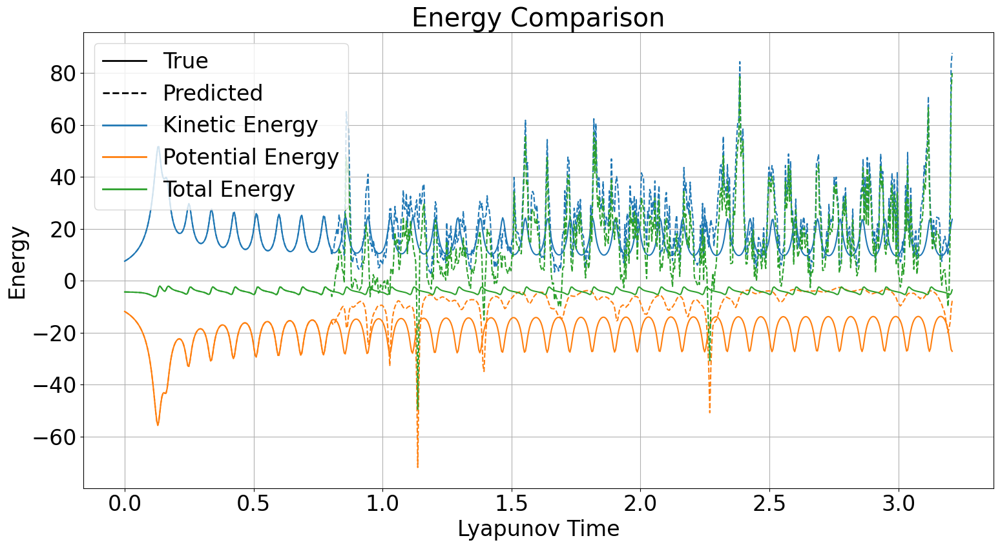

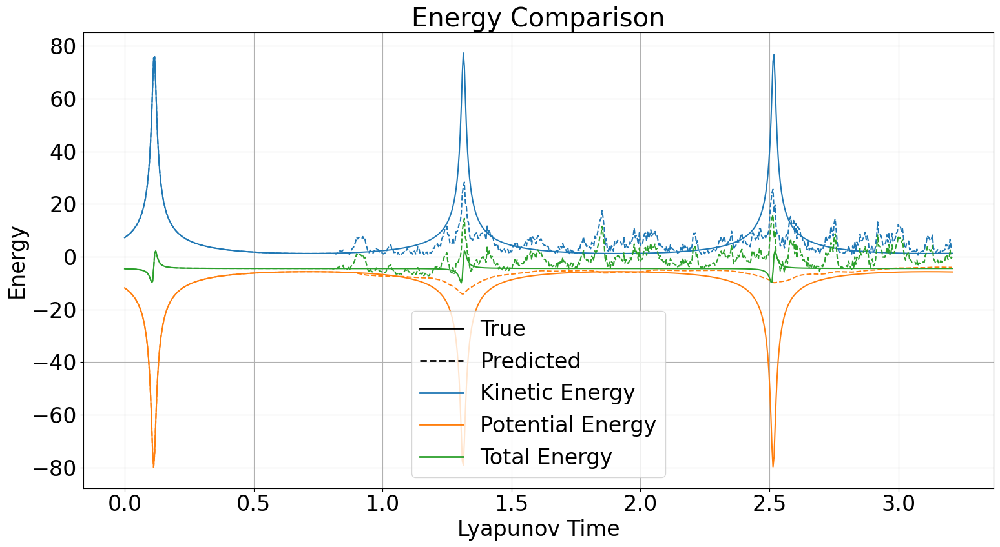

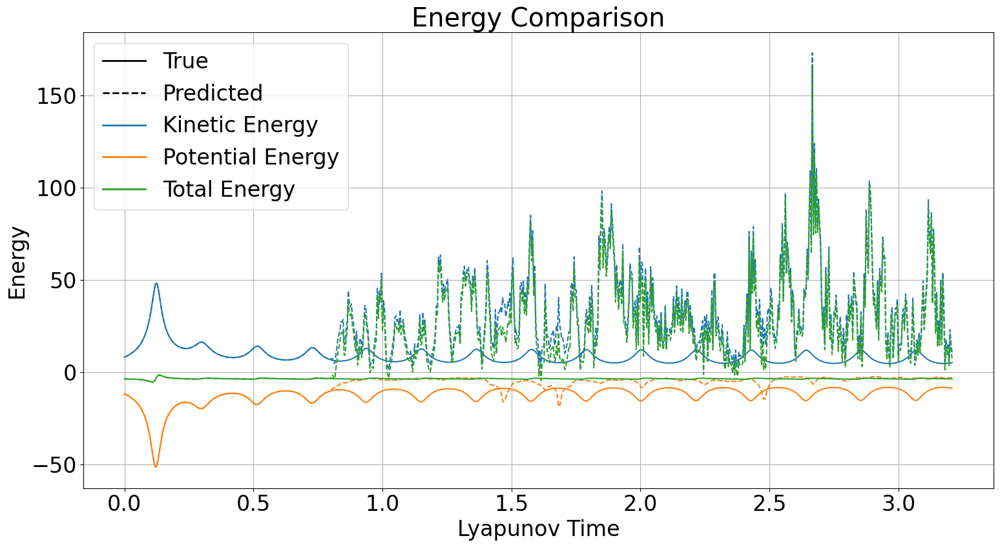

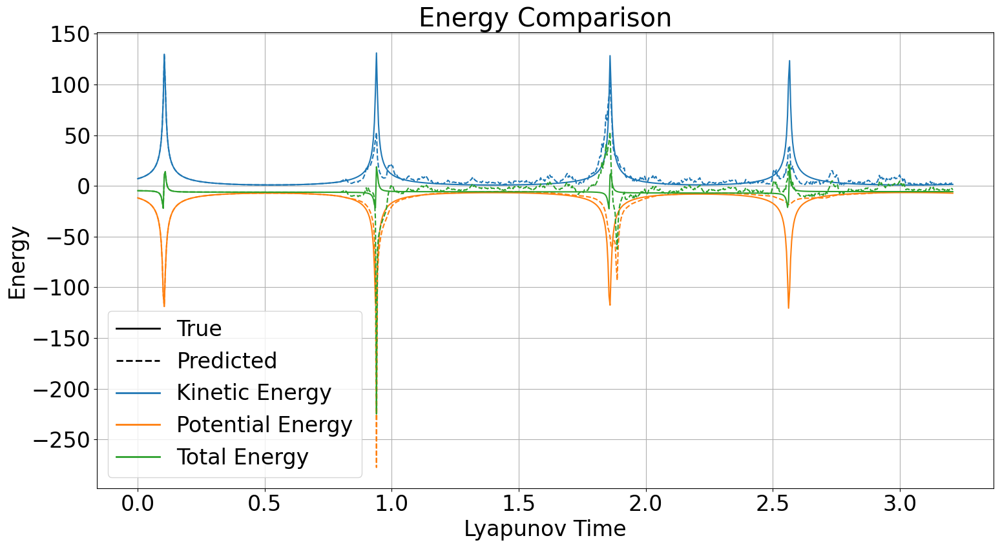

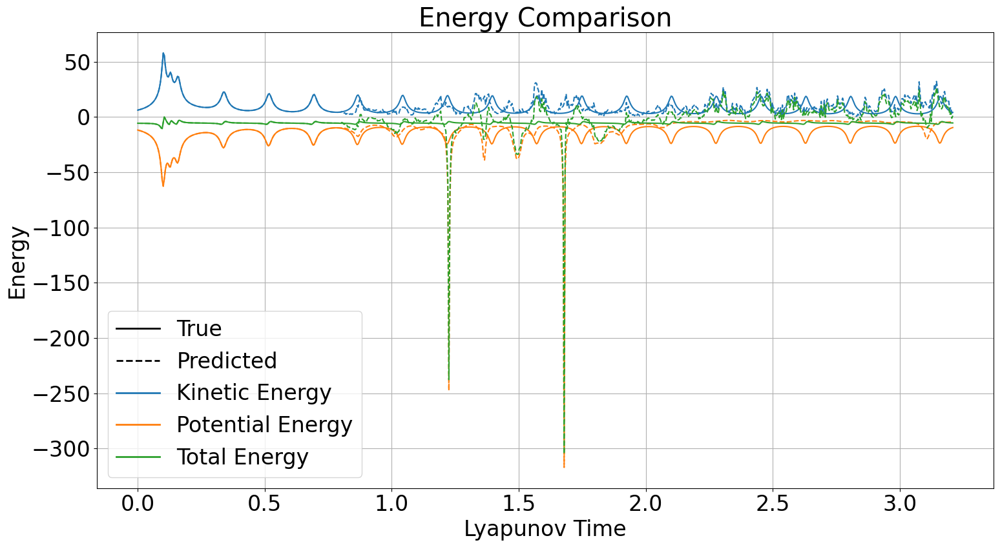

In [81]:
masses = [
    2 * math.sqrt(1.4799),  # Body 1
    2 * math.sqrt(1.4799),  # Body 2
    math.sqrt(1.4799)       # Body 3
]
dt = 0.01
velocity_position = 200

for i in [134, 144, 147, 151, 166]:
    true_data = np.concatenate([X_test[i], y_test_orig[i]], axis=0)
    pred_data = np.concatenate([X_test[i], y_pred_test_reservoir[i]], axis=0)

    # After getting your predicted data (with positions)

    pred_data_with_velocities = infer_velocities_from_positions(pred_data, dt, velocity_position)
    
    
    # Now use this for computing energy
    pred_energy = compute_energy_time_series(pred_data_with_velocities, masses)
    true_energy = compute_energy_time_series(true_data, masses)

    plot_kinetic_potential_total_energy(true_energy, pred_energy, title_prefix="")

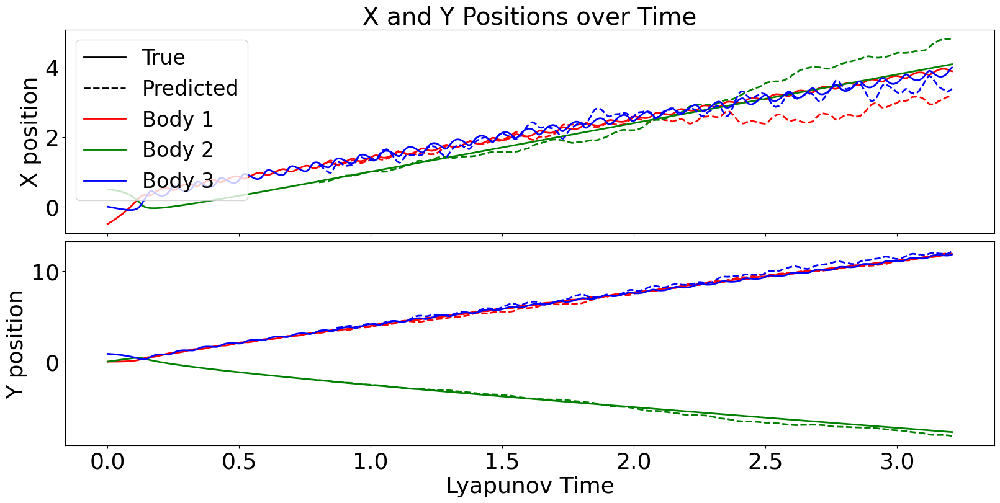

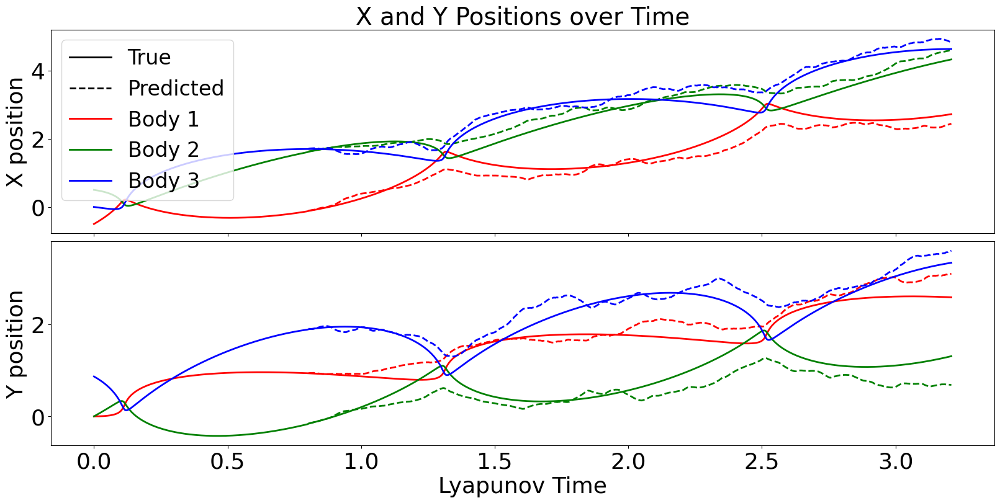

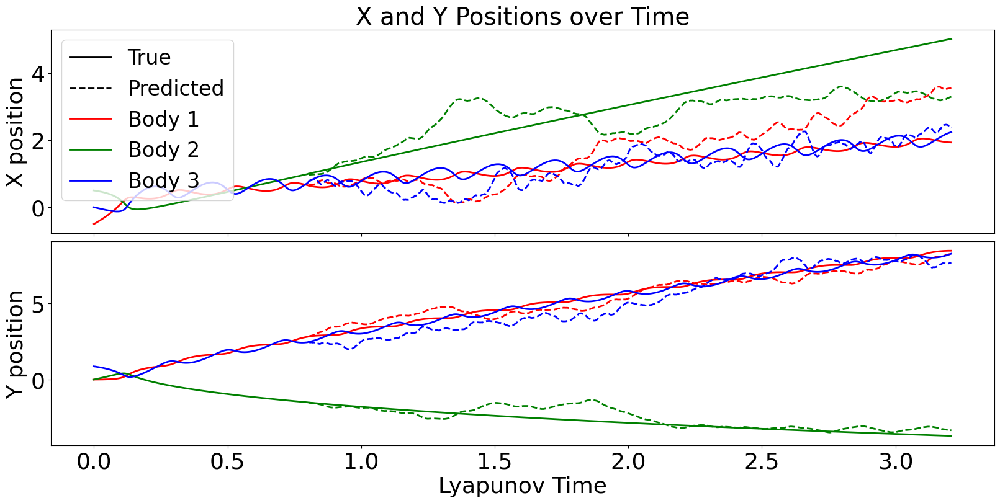

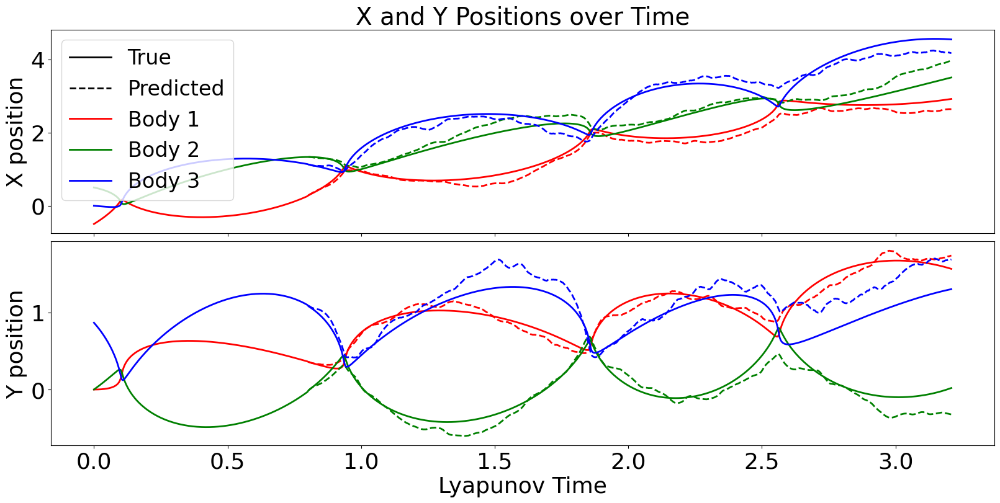

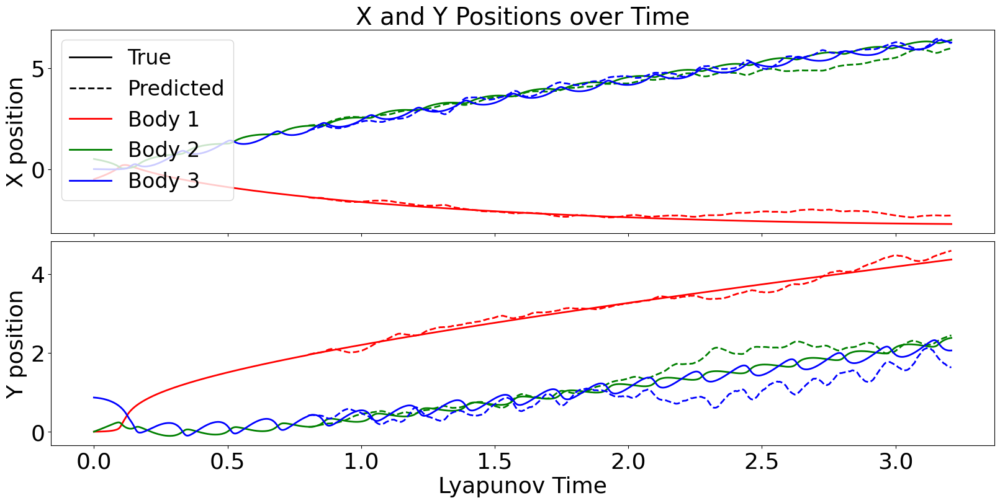

In [82]:
# Plot a sample
for i in [134, 144, 147, 151, 166]:
    plot_predictions_legend(X_test[:,:,:], y_test_orig, y_pred_test_reservoir, sequence_idx=i, smaller_font=24, small_font=26, large_font=28)

In [83]:
pred_data.shape

(800, 12)